### Important Note

If you're running this notebook on Google Colab, it will run a lot faster if you set the runtime type to **T4 GPU**.   
You can do this from the **Runtime** menu.

Runtime->Change Runtime Type->T4 GPU.

TO run cells, press the Play button.


### Introduction

* In this tutorial you will explore the use of generative AI (recurrent neural
network) for de novo molecular design.  You will use a generative model trained on SMILES to produce the structures of new molecules that could be potential antiviral drugs against coronaviruses such as SARS-COV-2. Specifically, you will be targeting the helicase enzyme (NSP-13), an enzyme that is critical to the virus's replicative machinery.

This CoLab notebook is broken down into **three sections**:

1. You will use [SMILES-RNN](https://github.com/MorganCThomas/SMILES-RNN), a generative model developed by Morgan Thomas. You'll explore a typical drug discovery scenario where we start with a molecule with known (but weak) activity and generate analogs that might be more active. Many of the analogs contain structural errors and problematic functionality, so you will use several strategies for identifying and removing these analogs from the dataset.


* **NOTE:** A discussion around different variations of the configuration file and its effects on the generated molecules can be found on the [GitHub repository](https://github.com/TomK-cpu/COVID-RNN-Virtual-Screen/issues/4). If you find improved outputs (i.e. diverse analogs) please feel free to upload your json file and a quick summary, as shown in the examples.


2. In step 2 you will simulate the cofolded structure of Nsp13 and your chosen molecule and estimate the binding free energy and Kd value using A.I., in this case [Boltz-2](https://www.biorxiv.org/content/10.1101/2025.06.14.659707v1.abstract), a later iteration of [Boltz-1.](https://www.biorxiv.org/content/10.1101/2024.11.19.624167v4)  

3. Once you have chosen your molecule, you will draw a Mass Spectrometry Fragmentation Tree Using RDKit. This will allow you to determine if you have successfully synthesised your molecule for testing.

### 0. Setup (approx. 1 min).

In [1]:
#@title 0.1. Install the necessary Python libraries.
%%capture
import sys
import subprocess

IN_COLAB = "google.colab" in sys.modules

if IN_COLAB:
    from IPython.utils import io

    print("In Google Colab - installing required packages...")

    with io.capture_output():
        subprocess.run(
            ['pip', 'install', 'git+https://github.com/PatWalters/SMILES-RNN', 'molscore', 'useful_rdkit_utils', 'mols2grid', 'seaborn']
        )

    print("Done!")

In [2]:
#@title 0.2. Import the required libraries.
from six.moves import urllib                            # downloading files
from glob import glob                                   # getting directory listings
import os                                               # sorting directory listings
import pandas as pd                                     # data manipulation
from tqdm.auto import tqdm                              # progress bars
from rdkit import Chem                                  # molecule manipulation
from rdkit.Chem.Draw import MolsToGridImage             # molecule grid images
import useful_rdkit_utils as uru                        # ring system checks
from rdkit.Chem import rdFingerprintGenerator           # chemical fingerprints
from rdkit.DataStructs import BulkTanimotoSimilarity    # chemical fingerprints
import seaborn as sns                                   # plotting
import matplotlib.ticker as ticker                      # plot formatting
import mols2grid                                        # interactive molecule viewer
import json                                             # read the configuration file
from rdkit.rdBase import BlockLogs                      # prevent the RDKit from generating lots of error messages

In [3]:
#@title 0.3. Enable progress bars for Pandas progress_apply.
tqdm.pandas()

In [5]:
#@title 0.4. Grab the the script the runs reinforcement learning from the SMILES-RNN GitHub repository, a checkpoint file with the prior distributions from ChEMBL 28, and a scoring configuration (JSON) file.
urllib.request.urlretrieve("https://raw.githubusercontent.com/MorganCThomas/SMILES-RNN/main/scripts/reinforcement_learning.py", "reinforcement_learning.py")
urllib.request.urlretrieve("https://raw.githubusercontent.com/MorganCThomas/SMILES-RNN/main/priors/ChEMBL28pur.ckpt","ChEMBL28pur.ckpt")
urllib.request.urlretrieve("https://raw.githubusercontent.com/TomK-cpu/COVID-RNN-Virtual-Screen/refs/heads/main/deco_hop.json","deco_hop.json")
urllib.request.urlretrieve("https://raw.githubusercontent.com/TomK-cpu/COVID-RNN-Virtual-Screen/refs/heads/main/deco_hop_v3.1.json","deco_hop_v3.1.json")

('deco_hop_v3.1.json', <http.client.HTTPMessage at 0x7b29cc228190>)

### 1. Introduction
In this notebook, we'll be use a generative model to generate structures of molecules similar to the reference molecule below.  This scenario arises frequently in drug discovery. We have a screening hit or a lead molecule and we'd like figure out how to modulate its properties or improve it's activity. One way to do this is to generate a set of analogs and use one or more computational models to evaluate the analogs.  This computational evaluation could involve docking, machine learning models or any of several other techniques.

We begin by using a reinforcement learning algorithm to generate a set molecules from a **prior** distribution trained on molecules from the ChEMBL database.  Molecules are sampled from this prior and each molecule is scored based on its similarity to the reference molecule below.  These similarities are used to update the prior so that the generated molecules continue to look more like the reference molecule.

If you want to generate analogs for a different molecule, just change **ref_smiles** below.

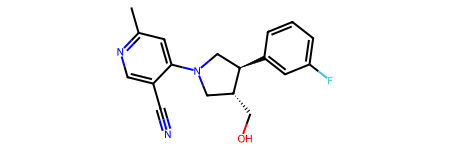

In [6]:
ref_smiles = "OC[C@H]1[C@H](C2=CC(F)=CC=C2)CN(C3=CC(C)=NC=C3C#N)C1"
ref_mol = Chem.MolFromSmiles(ref_smiles)
ref_mol

There is a list of fragments that were experimentally determined to bind the Nsp13 from https://cache-challenge.org/results-cache-challenge-2. We can also use these to further guide are RNN when generating new molecules.

Here are a list of molecular SMILES strings that have given an array of physiochemical and biochemical assay binding results:
    
    OC[C@H]1[C@H](C2=CC(F)=CC=C2)CN(C3=CC(C)=NC=C3C#N)C1   
    O[C@H]1[C@H](C2=CC=CC=C2)CN(C3=CC(C)=NC=C3C#N)C1   
    N#CC1=CC(C)=C(CC)N=C1N2C[C@@H](CO)[C@H](C3=CC=CC=C3)C2                  
    N#CC1=CN=CC=C1N2C[C@@H](C(OC)=O)[C@H](C3=CC(F)=CC=C3)C2
    OC([C@H]1[C@H](C2=CC=CC=C2)CN(C(C)=O)C1)=O
    OC([C@H]1[C@H](C2=CC=CC(OC)=C2)CN(C(C3=NC(N4C=NC=N4)=CC=C3)=O)C1)=O
    OC([C@H]1[C@H](C2=CC=CC(OC)=C2)CN(C(C3=CC(OCCO4)=C4C=C3)=O)C1)=O

First, lets visualise these molecules and some of the predicted molecular properties (MW, logP, HBA, HBD)::

In [7]:
#@title Genereate grid of Nsp13-bound fragments (reference smiles).
# --- 0 ▸ imports -------------------------------------------------------------
from rdkit import Chem
from rdkit.Chem import Descriptors, Crippen, Lipinski
import mols2grid, pandas as pd

# --- 1 ▸ your SMILES ----------------------------------------------------------
smiles_list = [
    "OC[C@H]1[C@H](C2=CC(F)=CC=C2)CN(C3=CC(C)=NC=C3C#N)C1",
    "O[C@H]1[C@H](C2=CC=CC=C2)CN(C3=CC(C)=NC=C3C#N)C1",
    "N#CC1=CC(C)=C(CC)N=C1N2C[C@@H](CO)[C@H](C3=CC=CC=C3)C2",
    "N#CC1=CN=CC=C1N2C[C@@H](C(OC)=O)[C@H](C3=CC(F)=CC=C3)C2",
    "OC([C@H]1[C@H](C2=CC=CC=C2)CN(C(C)=O)C1)=O",
    "OC([C@H]1[C@H](C2=CC=CC(OC)=C2)CN(C(C3=NC(N4C=NC=N4)=CC=C3)=O)C1)=O",
    "OC([C@H]1[C@H](C2=CC=CC(OC)=C2)CN(C(C3=CC(OCCO4)=C4C=C3)=O)C1)=O"
]
df = pd.DataFrame({"smiles": smiles_list})

# --- 2 ▸ RDKit Mol column -----------------------------------------------------
# (Having a Mol column makes descriptor calculation and highlighting easier)
df["mol"] = df["smiles"].apply(Chem.MolFromSmiles)

# --- 3 ▸ calculate a few descriptors -----------------------------------------
df["MW"]      = df["mol"].apply(Descriptors.MolWt)      # molecular weight
df["cLogP"]   = df["mol"].apply(Crippen.MolLogP)        # Crippen logP
df["HBA"]     = df["mol"].apply(Lipinski.NumHAcceptors) # H‑bond acceptors
df["HBD"]     = df["mol"].apply(Lipinski.NumHDonors)    # H‑bond donors

# Define your experimental crystallography list.
crystallography_list = [False, False, False, False, True, True, True]
df["XRAY?"] = crystallography_list

# Define your experimental KD values (µM).
#    Make sure the length matches smiles_list!
kd_binding_list = [
    (33, 84),
    (56, 44),
    (14, 36),
    (27, 49),
    (0, 0),
    (0, 0),
    (0, 0),
]
df["KD"] = [t[0] for t in kd_binding_list]
df["binding_pct"] = [t[1] for t in kd_binding_list]

# --- 4a ▸ HIGHLIGHT OPTION A – one SMARTS for every molecule ------------------
# (mols2grid will match it individually per molecule at render time)
ring_smarts = "c1ccccc1"          # highlight all benzene rings
df["highlight_smarts"] = ring_smarts

# --- 4b ▸ HIGHLIGHT OPTION B – explicit atom lists per molecule --------------
# Here we pre‑compute the ring atom IDs ourselves.
pattern = Chem.MolFromSmarts(ring_smarts)
def ring_atoms(m):
    match = m.GetSubstructMatch(pattern)
    return list(match) if match else []                 # empty list = no highlight
df["highlight_atoms"] = df["mol"].apply(ring_atoms)

# --- 5 ▸ show the grid --------------------------------------------------------
grid = mols2grid.display(
    df,
    smiles_col="smiles",
    subset=["img", "XRAY?", "KD", "MW", "cLogP", "HBA", "HBD"],
    # change the value that is written to the cell
    transform={
        "XRAY?": lambda v: "XRAY? yes" if v else "XRAY? no",
        "KD"   : lambda x: f"KD {x:.2f} µM, {int(x)}% binding",
        "MW"   : lambda x: f"MW {round(x,1)}",
        "cLogP": lambda x: f"logP {x:.2f}",
        "HBA"  : lambda x: f"HBA {x}",
        "HBD"  : lambda x: f"HBD {x}",
    },
    use_svg=True,
)
grid


MolGridWidget()

In [8]:
#@title Visualise the two most common core structures.
from rdkit import Chem
from rdkit.Chem import Descriptors, Crippen, Lipinski
import mols2grid, pandas as pd
# --- 1 ▸ your SMILES ----------------------------------------------------------
print("SMILES 1: [*][C@H]1[C@H](C(O)=O)CN(C([*])=O)C1",
      " SMILES 2: [*][C@H]1[C@H](CO)CN(C([*])=O)C1")
smiles_list = [
    "[*][C@H]1[C@H](C(O)=O)CN(C([*])=O)C1",
    "[*][C@H]1[C@H](CO)CN(C([*])=O)C1"
]
df = pd.DataFrame({"smiles": smiles_list})
# --- 5 ▸ show the grid --------------------------------------------------------
grid = mols2grid.display(
    df,
    smiles_col="smiles",
    use_svg=True,
)
grid

SMILES 1: [*][C@H]1[C@H](C(O)=O)CN(C([*])=O)C1  SMILES 2: [*][C@H]1[C@H](CO)CN(C([*])=O)C1


MolGridWidget()

In [9]:
#@title Import RDKit modules and convert your SMILES list into RDKit Mol objects:
from rdkit import Chem
from rdkit.Chem import rdFMCS
from rdkit.Chem.Scaffolds import MurckoScaffold
from rdkit.Chem import Draw

smiles_list = [
    "OC[C@H]1[C@H](C2=CC(F)=CC=C2)CN(C3=CC(C)=NC=C3C#N)C1",
    "O[C@H]1[C@H](C2=CC=CC=C2)CN(C3=CC(C)=NC=C3C#N)C1",
    "N#CC1=CC(C)=C(CC)N=C1N2C[C@@H](CO)[C@H](C3=CC=CC=C3)C2",
    "N#CC1=CN=CC=C1N2C[C@@H](C(OC)=O)[C@H](C3=CC(F)=CC=C3)C2",
    "OC([C@H]1[C@H](C2=CC=CC=C2)CN(C(C)=O)C1)=O",
    "OC([C@H]1[C@H](C2=CC=CC(OC)=C2)CN(C(C3=NC(N4C=NC=N4)=CC=C3)=O)C1)=O",
    "OC([C@H]1[C@H](C2=CC=CC(OC)=C2)CN(C(C3=CC(OCCO4)=C4C=C3)=O)C1)=O"
]

# Parse into RDKit molecules (filter out any invalid SMILES)
mols = [Chem.MolFromSmiles(s) for s in smiles_list]
mols = [m for m in mols if m is not None]

RDKit’s FindMCS runs a graph‐based search to identify the largest shared subgraph.

In [10]:
#@title Find the Maximum Common Substructure (MCS)
mcs_result = rdFMCS.FindMCS(
    mols,
    timeout=10,             # seconds to spend before giving up
    threshold=1.0,          # fraction of molecules that must contain the MCS (1.0 = all)
    matchValences=True,     # require matching valence states
    atomCompare=rdFMCS.AtomCompare.CompareElements,
    bondCompare=rdFMCS.BondCompare.CompareOrder
)
common_smarts = mcs_result.smartsString
print("Number of atoms in MCS:", mcs_result.numAtoms)
print("Common SMARTS:", common_smarts)


Number of atoms in MCS: 14
Common SMARTS: [#6]-,:[#6]-,:[#6]-[#7](-[#6]-[#6]-[#6]1:[#6]:[#6]:[#6]:[#6]:[#6]:1)-[#6]-,:[#6]


Turn the SMARTS into an RDKit molecule, then check which input molecules contain it:

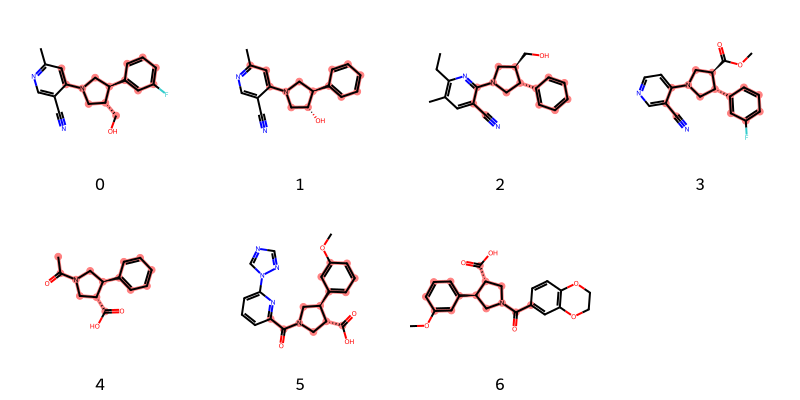

In [11]:
#@title Convert and Validate the SMARTS
common_mol = Chem.MolFromSmarts(common_smarts)

# Highlight the substructure in each original molecule
imgs = []
for m in mols:
    match = m.GetSubstructMatch(common_mol)
    imgs.append(Draw.MolToImage(m, highlightAtoms=match, size=(200,200)))

# Display as a grid
Draw.MolsToGridImage(mols,
                    highlightAtomLists=[m.GetSubstructMatch(common_mol) for m in mols],
                    legends=[str(i) for i in range(len(mols))],
                    molsPerRow=4)


Sometimes the core ring scaffold is all you need rather than the full MCS. You can compute Bemis–Murcko scaffolds for each molecule and then find the most frequent scaffold:

Most common Murcko scaffold appears 2×:
[#6]1-[#6@H](-[#6]2:[#6]:[#6]:[#6]:[#6]:[#6]:2)-[#6]-[#7](-[#6]2:[#6]:[#6]:[#7]:[#6]:[#6]:2)-[#6]-1


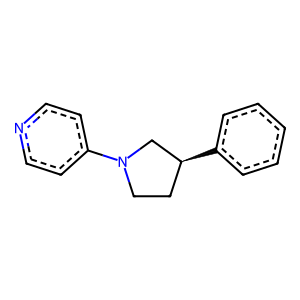

In [15]:
#@title Extract Common Murcko Scaffolds

# 1) compute each molecule’s Murcko scaffold
scaffolds = [MurckoScaffold.GetScaffoldForMol(m) for m in mols]
smarts_list = [Chem.MolToSmarts(s) for s in scaffolds]

# 2) count frequency
from collections import Counter
counts = Counter(smarts_list)
most_common_smarts, freq = counts.most_common(1)[0]
print(f"Most common Murcko scaffold appears {freq}×:")
print(most_common_smarts)

# 3) visualize the scaffold
scaf_mol = Chem.MolFromSmarts(most_common_smarts)
Draw.MolToImage(scaf_mol, size=(300,300))

SMILES: C1:C:C:C([C@H]2CCN(C3:C:C:N:C:C:3)C2):C:C:1


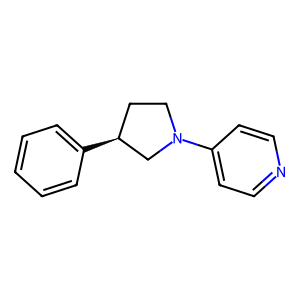

In [13]:
#@title Visualise the Most Common Murcko Scaffold (MCS)
from rdkit import Chem

# 1. Define your SMARTS pattern
smarts = "[#6]1-[#6@H](-[#6]2:[#6]:[#6]:[#6]:[#6]:[#6]:2)-[#6]-[#7](-[#6]2:[#6]:[#6]:[#7]:[#6]:[#6]:2)-[#6]-1"

# 2. Parse it into a query Mol
query_mol = Chem.MolFromSmarts(smarts)
if query_mol is None:
    raise ValueError("Invalid SMARTS pattern")

# 3. Convert the query Mol to a SMILES

# Convert aromatic query to Kekulé form
kek_query = Chem.Kekulize(query_mol, clearAromaticFlags=True)

# Serialize with explicit bond orders
kek_smiles = Chem.MolToSmiles(query_mol, kekuleSmiles=True)
print('SMILES:', kek_smiles)  # 'C1=CC=CC=C1'

# 3) visualize the scaffold
kek_smiles_mol = Chem.MolFromSmiles(kek_smiles)
Draw.MolToImage(kek_smiles_mol, size=(300,300))

Once you have your common SMARTS, you can screen larger libraries by mol.HasSubstructMatch(common_mol).

## Understanding the configration file (deco_hop.json)

Before going further (and changing the parameters that the recurrent neural network uses to learn, we must understand the current scoring functions in the deco_hop.json file, then change them accordingly to see the impac this has on the generated molecular output.

**To open the json, double click on deco_hop.json file in the left side-bar. **

This configuration file tells the SMILES-RNN reinforcement learning script how to evaluate each generated molecule. It defines four individual scoring functions—three substructure filters and one similarity measure—and then combines them into a single overall score.

Further information and examples of JSON configuration files for the SMILES_RNN can be found here:

TUTORIALS: https://github.com/MorganCThomas/MolScore/blob/main/tutorials/defining_an_objective.md

EXAMPLES: https://github.com/MorganCThomas/MolScore/tree/main/molscore/configs , re


### 2. Run Reinforcement Learning (RL)

Modify the configuration file used by SMILES-RNN.  The file is written in the JSON format, which allows it to be read directly into a Python dictionary.  We read the file and put its contents into a dictionary called **input_dict**.  We can then modify one field in the dictionary to insert the SMILES we are using for molecule generation.  Then we write a new configuration file called **smiles_rnn_config.json** that we will use in the next step.

In [ ]:
#@title Minimal interactive JSON editor (Tanimoto only – no substruct metrics)
import json, ipywidgets as w, pathlib
from IPython.display import display, clear_output

# make sure the file path is identical to the one used by MolScore
CONFIG_PATH = pathlib.Path("/content/fragment_005_similarity.json").resolve()
print("Editing:", CONFIG_PATH)

cfg = json.load(open(CONFIG_PATH))

def multiline(text: str):
    return [ln.strip() for ln in text.splitlines() if ln.strip()]

# ── keep the FIRST TanimotoSimilarity block only ──────────────────────────
tan_fn = next(fn for fn in cfg["scoring_functions"]
              if fn["name"] == "TanimotoSimilarity")
cfg["scoring_functions"] = [tan_fn]

# ── widgets for that block ────────────────────────────────────────────────
p = tan_fn["parameters"]
tan_widgets = {
    "prefix"    : w.Text(value=p["prefix"], description="prefix"),
    "ref_smiles": w.Textarea(value="\n".join(p["ref_smiles"]),
                             description="ref_smiles"),
    "radius"    : w.IntSlider(value=p["radius"], min=0, max=4, step=1,
                              description="radius"),
    "bits"      : w.IntText(value=p["bits"], description="bits"),
    "features"  : w.Checkbox(value=p["features"], description="features"),
    "counts"    : w.Checkbox(value=p["counts"], description="counts"),
    "method"    : w.Dropdown(value=p["method"], options=["max","mean"],
                             description="method"),
    "n_jobs"    : w.IntText(value=p["n_jobs"], description="n_jobs")
}
tan_box = w.VBox([w.HTML("<b>TanimotoSimilarity</b>"), *tan_widgets.values()],
                 layout=w.Layout(border="1px solid #ccc", padding="6px",
                                 margin="4px 0"))

# ── build widgets for every metric that is NOT a substructure one ─────────
def build_metric_widgets(metric):
    wdict = {
        "weight": w.FloatSlider(value=metric["weight"], min=0, max=3, step=0.05,
                                description="weight"),
        "modifier": w.Dropdown(value=metric["modifier"],
                               options=["raw","lin_thresh","lin",
                                        "gauss","sigmoid","step"],
                               description="modifier")
    }
    for k, v in metric.get("parameters", {}).items():
        if k in ("upper","lower","buffer"):
            wdict[k] = w.FloatSlider(value=float(v), min=0, max=1,
                                     step=0.01, description=k)
        elif k == "objective":
            wdict[k] = w.Dropdown(value=v, options=["maximize","minimize"],
                                  description="objective")
        else:
            wdict[k] = w.Text(value=str(v), description=k)
    box = w.VBox([w.HTML(f"<b>{metric['name']}</b>"),
                  wdict["weight"], wdict["modifier"],
                  *[wdict[k] for k in wdict if k not in ("weight","modifier")]],
                 layout=w.Layout(border="1px solid #ccc", padding="6px",
                                 margin="4px 0"))
    return wdict, box

metric_boxes = []
clean_metrics = []
for m in cfg["scoring"]["metrics"]:
    if "substruct_match" in m["name"].lower():
        continue
    clean_metrics.append(m)
    wdict, panel = build_metric_widgets(m)
    metric_boxes.append((m, wdict, panel))
cfg["scoring"]["metrics"] = clean_metrics          # purge hidden ones

# ── aggregation method dropdown ───────────────────────────────────────────
method_dd = w.Dropdown(value=cfg["scoring"].get("method","single"),
                       options=["single","product","weighted_sum"],
                       description="scoring.method")

# ── save callback ─────────────────────────────────────────────────────────
status = w.Output()
def save_json(_):
    # ⓵ purge any substructure metrics that might sneak in later
    cfg["scoring"]["metrics"] = [
        m for m in cfg["scoring"]["metrics"]
        if "substruct_match" not in m["name"].lower()
    ]

    cfg["scoring"]["method"] = method_dd.value

    # update tanimoto parameters
    for k, wdg in tan_widgets.items():
        tan_fn["parameters"][k] = multiline(wdg.value) if k=="ref_smiles" else wdg.value

    # update metrics
    for metric, wdict, _ in metric_boxes:
        metric["weight"]   = wdict["weight"].value
        metric["modifier"] = wdict["modifier"].value
        for k, wdg in wdict.items():
            if k in ("weight","modifier"): continue
            metric["parameters"][k] = wdg.value

    # write
    with open(CONFIG_PATH, "w") as f:
        json.dump(cfg, f, indent=2)

    with status:
        clear_output()
        print("✅ JSON saved to:", CONFIG_PATH)

save_btn = w.Button(description="Save JSON", button_style="success")
save_btn.on_click(save_json)

# ── display ───────────────────────────────────────────────────────────────
display(w.HTML("<h3>🛠️ Edit Tanimoto Scoring Function</h3>"), tan_box)
display(w.HTML("<h3>⚖️ Edit Metric Settings</h3>"), method_dd)
display(w.VBox([panel for _,_,panel in metric_boxes]), save_btn, status)


Editing: /content/fragment_005_similarity.json


HTML(value='<h3>🛠️ Edit Tanimoto Scoring Function</h3>')

HTML(value='<h3>⚖️ Edit Metric Settings</h3>')

Dropdown(description='scoring.method', options=('single', 'product', 'weighted_sum'), value='single')

Button(button_style='success', description='Save JSON', style=ButtonStyle())

Output()

During training every SMILES that the agent samples is evaluated as follows:

It must contain the quinazolinone‑like scaffold (S2 = 1)

…and must not contain either the thieno‑pyrimidine PAINS ring (S3) or a sulfone handle (S4).

If the molecule survives those filters, its fingerprint similarity to the reference is mapped onto 0 → 1 (S5).

The four values are averaged; the result is multiplied by sigma inside the chosen RL strategy to turn it into a loss/advantage.

Because three of the four metrics are binary pass/fail, most molecules score 0 → 0.25 until the agent learns the exact scaffold and filter requirements; once it does, optimisation focuses on nudging similarity above 0.75 to hit the full score of 1.


In [16]:
#@title Run Reinforcement Learning Recurrent Neural Network
!python reinforcement_learning.py -p ChEMBL28pur.ckpt -m deco_hop_v3.1.json --model RNN -d gpu RV2

OpenEye functions: currently unavailable due to the following: No module named 'openeye'
PoseCheck metrics: currently unavailable due to the following: No module named 'prolif'
2025-07-29 10:31:15.862580: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1753785075.882340    5493 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1753785075.888387    5493 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
Device set to cuda
100% 250/250 [09:25<00:00,  2.26s/it]


### 3. Retrieve RL Results

In [20]:
#@title 3.1. Find the most recent result set.
files = glob("*SMILES-RNN_Deco_hop*") #change to SMILES-RNN_Scaffold_hop
files.sort(key=os.path.getmtime,reverse=True)
dir_path = files[0]
dir_path

'2025_07_29_SMILES-RNN_Deco_hop'

In [21]:
#@title 3.2. Read the scores from the most recent result set into a dataframe.
df = pd.read_csv(f"{dir_path}/scores.csv")
len(df)

32000

In [22]:
#@title Show a table summary of the dataframe.
df

,Unnamed: 0,model,task,step,batch_idx,absolute_time,smiles,valid,valid_score,unique,...,filter,score_time,prior,agent,batch_size,rl_strategy,sigma,loss,prior_nll,agent_nll
0,0,RNN,Deco_hop,0,0,3.156440,c1ccc2c(c1)COc1ccc(N3CCNCC3)cc1-2,True,1,True,...,1.0,2.017723,ChEMBL28pur.ckpt,ChEMBL28pur.ckpt,128,RV,120,11.322659,22.052930,22.052923
1,1,RNN,Deco_hop,0,1,3.156440,O=C1NC(=O)C2(N=C(c3c[nH]c4ccccc34)Cc3ccccc32)N1,True,1,True,...,1.0,2.017723,ChEMBL28pur.ckpt,ChEMBL28pur.ckpt,128,RV,120,19.651426,27.284880,27.284882
2,2,RNN,Deco_hop,0,2,3.156440,Cc1nnc(C2CN(c3nccc(-c4cn[nH]c4)n3)C2)o1,True,1,True,...,1.0,2.017723,ChEMBL28pur.ckpt,ChEMBL28pur.ckpt,128,RV,120,33.465584,28.055874,28.055850
3,3,RNN,Deco_hop,0,3,3.156440,O=C(NCC(O)CN1CCc2ccccc2C1)c1ccc(Cl)c(Cl)c1,True,1,True,...,1.0,2.017723,ChEMBL28pur.ckpt,ChEMBL28pur.ckpt,128,RV,120,17.395391,19.214115,19.214098
4,4,RNN,Deco_hop,0,4,3.156440,Cc1ccc(NC(=O)c2ccc3c(c2)OCCO3)cc1,True,1,True,...,1.0,2.017723,ChEMBL28pur.ckpt,ChEMBL28pur.ckpt,128,RV,120,6.855537,18.035260,18.035257
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31995,31995,RNN,Deco_hop,249,123,565.952101,COc1ccc(NC(=O)C2CCN(S(=O)(=O)c3cccc4ccccc34)CC...,True,1,True,...,1.0,1.191016,ChEMBL28pur.ckpt,ChEMBL28pur.ckpt,128,RV,120,0.093697,23.382294,18.054031
31996,31996,RNN,Deco_hop,249,124,565.952101,FC(F)(F)c1cccc(Nc2ccccn2)c1,True,1,True,...,1.0,1.191016,ChEMBL28pur.ckpt,ChEMBL28pur.ckpt,128,RV,120,15.602529,20.000528,13.944663
31997,31997,RNN,Deco_hop,249,125,565.952101,N#Cc1cc(Br)ccc1-c1ccc(CNCCO)cc1,True,1,True,...,1.0,1.191016,ChEMBL28pur.ckpt,ChEMBL28pur.ckpt,128,RV,120,0.921693,27.085638,23.205172
31998,31998,RNN,Deco_hop,249,126,565.952101,CC(=O)OCC1OC(O)C(O)C1O,True,1,True,...,1.0,1.191016,ChEMBL28pur.ckpt,ChEMBL28pur.ckpt,128,RV,120,2.778068,22.063494,16.573013


### 4. Remove Duplicate Results

In [23]:
#@title 4.1. Remove duplicate molecules.
df_unique = df.drop_duplicates(subset=["smiles"]).copy()
len(df_unique)

31898

Drop any cases where we have a bad SMILES

In [24]:
#@title 4.2. Drop any cases where we have a bad SMILES.
df_unique.dropna(subset="smiles",inplace=True)
len(df_unique)

31898

Let's make one more check for duplicates.  To do this, we'll first add an RDKit molecule to the dataframe, then use that molecule to generate a SMILES string. Note that when we execute the cell below, we get several error messages. This is because not all the SMILES the RNN generates are valid.  However, we are using the [BlockLogs](https://www.rdkit.org/docs/source/rdkit.rdBase.html) function from the RDKit suppress the warning messages. This an example of a [context manager](https://book.pythontips.com/en/latest/context_managers.html), a very usefule Python feature. We'll take care of the invalid molecules below.

In [25]:
#@title 4.2. Make one more check for duplicates.
with BlockLogs():
    df_unique['mol'] = df_unique.smiles.progress_apply(Chem.MolFromSmiles)

  0%|          | 0/31898 [00:00<?, ?it/s]

As we saw above, there were numerous invalid SMILES.  Let's see how many SMILES failed to convert to molecules.

In [26]:
#@title 4.3. Show many SMILES failed to convert to molecules.
sum(df_unique.mol.isna())

1793

Let's remove the invalid molecules from the dataframe.

In [27]:
#@title 4.4. Remove the invalid molecules from the dataframe.
df_unique_ok = df_unique.dropna(subset=["mol"]).copy()
len(df_unique_ok)

30105

One more check for duplicates.  We'll convert the molecules to SMILES and check for duplicates.

In [28]:
#@title 4.5. Convert the molecules to SMILES and check for duplicates.
df_unique_ok['cansmi'] = df_unique_ok.mol.progress_apply(Chem.MolToSmiles)

  0%|          | 0/30105 [00:00<?, ?it/s]

Compare the length of the dataframe with the number of unique SMILES.  These are the same, which is great.

In [29]:
#@title 4.6. Compare the length of the dataframe with the number of unique SMILES.
len(df_unique_ok),len(df_unique_ok.cansmi.unique())

(30105, 30105)

### 5. Remove Molecules With Questionable Ring Systems
While we removed molecules that violate standard rules of valence, there still may be some molecules that are not chemically stable.  One way to identify these is to compare the ring systems in the generated molecules with those in the ChEMBL database.  If a molecule contains a ring system not in ChEMBL, that molecule is probably unstable or very difficult to sythesize. This [blog post](https://practicalcheminformatics.blogspot.com/2022/12/identifying-ring-systems-in-molecules.html) has more information ring system analysis. The code below adds two columns to the dataframe.
* min_ring - the ring system in each molecule that occurs least frequently
* min_freq - the frequency with which **min_ring** occurs  

In [30]:
#@title 5.1. Add two columns (min_ring and min_freq) to the dataframe.
ring_system_lookup = uru.RingSystemLookup()
df_unique_ok['ring_systems'] = df_unique_ok.mol.progress_apply(ring_system_lookup.process_mol)
df_unique_ok[['min_ring','min_freq']] = [uru.get_min_ring_frequency(x) for x in df_unique_ok.ring_systems]

  0%|          | 0/30105 [00:00<?, ?it/s]

Let's see how many molecules contain ring systems that occur fewer than 100 times in ChEMBL.

In [31]:
#@title 5.2. Check how many molecules contain ring systems that occur fewer than 100 times in ChEMBL.
len(df_unique_ok.query("min_freq < 100"))

3110

Put the molecules with questionable ring systems into another dataframe so we can take a closer look.  We are looking for molecules with **min_freq** < 100 and **min_freq** >= 0.   We add the ">= 0" to retain acyclic molecules, whose **min_freq** values are set to -1.

In [32]:
#@title 5.3. Put the molecules with questionable ring systems into another dataframe.
bad_ring_df = df_unique_ok.query("min_freq < 100 and min_freq >= 0")

We'll take a look at a few of these, highlighting the questionable ring systems.  For simplictiy, let's grab the first 16 rows in **df_unique_ok**.

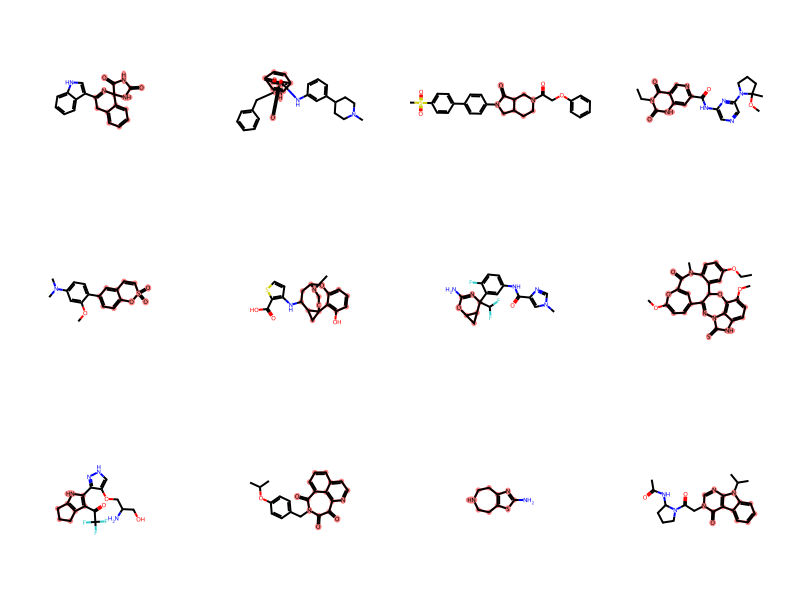

In [33]:
#@title 5.4. Inspect the first 12 rows in df_unique_ok.
mols_to_show = 12
match_atom_list = [x.GetSubstructMatch(Chem.MolFromSmiles(y)) for x,y in bad_ring_df[["mol","min_ring"]].head(mols_to_show).values]
MolsToGridImage(bad_ring_df.mol.values[:12],molsPerRow=4,useSVG=False,highlightAtomLists=match_atom_list,subImgSize=(200,200))

After examining the image above, we can be confident that we are indeed removing questionable ring systems.  Let's remove these molecules from **df_unique_ok**.  We'll add "or min_freq" < 0" to retain the acyclic molecules.

In [34]:
#@title 5.5. Remove these molecules from df_unique_ok.
df_unique_ok_ring = df_unique_ok.query("min_freq > 100 or min_freq < 0").copy()
len(df_unique_ok_ring)

27011

At this point we've removed the molecules with questionable ring systems, but we still have some molecules with potentially reactive functionality.  We can remove these using the REOS (Rapid Elimination of Swill) filters available in the useful_rdkit_utils package.  For more information on functional group filters, see this [blog post](https://practicalcheminformatics.blogspot.com/2018/08/filtering-chemical-libraries.html).

In [35]:
#@title 5.6. Remove molecules with potentially reactive functionality using the REOS (Rapid Elimination of Swill) filters.
reos = uru.REOS()
df_unique_ok_ring[["rule_set","rule"]] = df_unique_ok_ring.mol.progress_apply(reos.process_mol).to_list()

  0%|          | 0/27011 [00:00<?, ?it/s]

We can use **value_counts** to see which rules eliminated the largest number of molecules.

In [36]:
#@title 5.7. Check which rules eliminated the largest number of molecules.
df_unique_ok_ring.rule.value_counts()

,count
rule,
ok,26533
I5 Thiols,208
R17 acylhydrazide,62
I16 Betalactams,29
"R18 Quaternary C, Cl, I, P or S",27
R24 Isonitrile,21
I13 Cyanamides,21
R2 Acid halides,14
I12 Thioesters,13


In [37]:
#@title 5.8. Define the dataframe containing the sterilised molecule set 'df_unique_ok_ring_reos'.
df_unique_ok_ring_reos = df_unique_ok_ring.query("rule == 'ok'").copy()

Now let's see how similar the molecules we generated are to the molecules we started with.  We can do this by generating fingerprints for the generated molecules and calculating the Tanimoto similarity to the starting molecule.

In [38]:
#@title 5.9. Create the fingerprint generator and apply to molecules in a DataFrame.
fp_gen = rdFingerprintGenerator.GetMorganGenerator(radius=2,fpSize=4096,countSimulation=True)
df_unique_ok_ring_reos['fp'] = df_unique_ok_ring_reos.mol.progress_apply(fp_gen.GetFingerprint)

  0%|          | 0/26533 [00:00<?, ?it/s]

In [39]:
#@title 5.91. Generate a fingerprint for the starting molecule.
ref_fp = fp_gen.GetFingerprint(ref_mol)

Calculate the similarity of the generated molecules to the reference.

In [40]:
#@title 5.92. Calculate the similarity of the generated molecules to the reference.
df_unique_ok_ring_reos['fp_sim'] = BulkTanimotoSimilarity(ref_fp,df_unique_ok_ring_reos.fp.values)

The molecule generation process proceeds over 250 steps with 128 molecules generated at each step.  Let's make a box plot of step vs similarity to the reference molecule. From the plot below, we can see a couple things.
* The mean similarity at each step increases for the first ~80 steps, then levels off.
* Steps 100-250 are sparse, this is due to the fact that we removed duplicate structures above.  After step 100, most of the generated structures are duplicates.

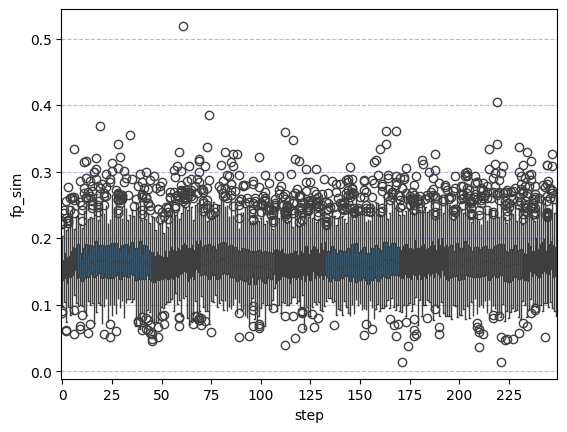

In [41]:
#@title 5.93. Make a box plot of step vs similarity to the reference molecule.
ax = sns.boxplot(x="step",y="fp_sim",data=df_unique_ok_ring_reos)
ax.xaxis.set_major_locator(ticker.MultipleLocator(25))
ax.xaxis.set_major_formatter(ticker.ScalarFormatter())
ax.grid(axis='y', color='blue', linestyle='--', alpha=0.3)

In many cases, we will want to perform some further analysis on the the generated analogs.  For instance, we could select a subset of the analogs and dock them into a protein crystal structure to identify analogs which could bind to a specific protein target.  Since methods like docking tend to be more computationally expensive, we may want to cluster the molecules to identify a representative subset.

Morgan fingerprints encode the structural features of each molecule into a binary vector.

Tanimoto similarity compares two such vectors and returns a score between 0 (no shared features) and 1 (identical feature sets).

By filtering with fp_sim >= 0.35, you are keeping only those generated molecules whose fingerprint similarity to your reference compound is 35% or higher.

In practice, this means you focus on analogs that share a moderate amount of structural features with your starting molecule, discarding those that are too dissimilar for your downstream analyses.

We begin by using a molecular similarity cutoff to select analogs similar to the input molecule.  When using Morgan fingerprints as a measure of molecular similarity, 0.35 is a widely accepted cutoff for similar molecules.

In [42]:
#@title 5.94. Use Morgan fingerprints as a measure of molecular similarity (0.35 cutoff) to select analogs similar to the input molecule.
similar_df = df_unique_ok_ring_reos.query("fp_sim >= 0.35").copy()

In [43]:
#@title 5.95. After selecting the similar molecules, we can cluster using the same similarity cutoff.
similar_df['cluster'] = uru.taylor_butina_clustering(similar_df.fp.values,cutoff=0.35)

In [44]:
#@title 5.96. Finally, we can see how many molecules are in each cluster.
similar_df.cluster.value_counts()

,count
cluster,
7,1
6,1
5,1
4,1
3,1
2,1
1,1
0,1


We might want to narrow down our list of molecules based on a perticular motif, e.g. a pyrroldine ring like that in the original strucutres. This can be done by typing the SMARTS string for the motif in the text box, then clicking 'SMARTS'.

Once you've selected the desired molecules you wish to screen, go to the dropdown menu on the right (...) and select 'Save SMILES'.

In [45]:
#@title Search SMARTS strings for particular structures in the search box, or by descriptors (e.g. HBA 4).

# Basic five-membered saturated N-heterocycle: N1CCCC1

# Explicit sp³-nitrogen in a 5-ring: [NX3;R5]1CCC1

# Basic five-membered saturated N-heterocycle: [NX3;R5]1*CCC*

# Substructure requiring at least one ring substituent: [NX3;R5]1CCC([#6])C1

# Carboxylic acid: [CX3](=O)[OX2H1]

# Matches an –OH (oxygen with two connections and one H) bonded to any sp³ carbon CX4: [OX2H][CX4;!$(C([OX2H])[O,S,#7,#15])]

# One hydrogen bond donor: HBD 1

# Molecular weight 300 Da: MW 300

In [46]:
#@title 5.97. Create a table of generated molecules.
from rdkit import Chem
from rdkit.Chem import Descriptors, Crippen, Lipinski
import mols2grid

# Sort by similarity
df_sorted = df_unique_ok_ring_reos.sort_values(
    by='fp_sim',
    ascending=False
).reset_index(drop=True)

# (Re)compute Mol objects & descriptors if not already present
df_sorted['mol'] = df_sorted['smiles'].apply(Chem.MolFromSmiles)
df_sorted['MW']    = df_sorted['mol'].apply(Descriptors.MolWt)
df_sorted['cLogP'] = df_sorted['mol'].apply(Crippen.MolLogP)
df_sorted['HBA']   = df_sorted['mol'].apply(Lipinski.NumHAcceptors)
df_sorted['HBD']   = df_sorted['mol'].apply(Lipinski.NumHDonors)

# Optional: highlight benzene rings
pattern = Chem.MolFromSmarts("c1ccccc1")
df_sorted['highlight_atoms'] = df_sorted['mol'].apply(
    lambda m: list(m.GetSubstructMatch(pattern))
)

# Display top N by similarity
mols2grid.display(
    df_sorted,
    mol_col="mol",
    smiles_col="smiles",
    highlight_atoms_col="highlight_atoms",
    subset=["img", "fp_sim", "MW", "cLogP", "HBA", "HBD"],
    transform={
        "fp_sim": lambda x: f"fp_sim {x:.2f}",
        "MW":    lambda x: f"MW {round(x, 1)}",
        "cLogP": lambda x: f"logP {x:.2f}",
        "HBA":   lambda x: f"HBA {x}",
        "HBD":   lambda x: f"HBD {x}",
    },
    use_svg=True,
    maxItems=32
)

MolGridWidget()

# Running Boltz-2 simulations of generated molecules.

In [ ]:
#@title Install dependencies
#@markdown Select your runtime type. \
#@markdown GPU runtime with a high capacity RAM is strongly recommended.

runtime = "GPU(L4 or T4)" #@param ["TPU", "GPU(A100)", "GPU(L4 or T4)", "CPU"]

import os
import subprocess

print('Installing dependencies... ', end='')
dependencies = "torch torchvision torchaudio numpy hydra-core pytorch-lightning "
dependencies += "rdkit dm-tree requests pandas types-requests einops einx fairscale "
dependencies += "mashumaro modelcif wandb click pyyaml biopython scipy numba gemmi "
dependencies += "scikit-learn chembl_structure_pipeline "
dependencies += "cuequivariance_ops_cu12 cuequivariance_ops_torch_cu12 cuequivariance_torch"

if runtime == "GPU(L4 or T4)":
    precision = '32-true'
else:
    precision = 'bf16-true'

subprocess.run("pip install ipywidgets torch torchvision torchaudio", shell=True)
subprocess.run("git clone https://github.com/jwohlwend/boltz.git", shell=True)
subprocess.run(f"sed -i 's/bf16-mixed/{precision}/g' /content/boltz/src/boltz/main.py", shell=True)
subprocess.run(f"pip install {dependencies}", shell=True)
subprocess.run("cd boltz; pip install --no-deps -e .", shell=True)

print('done.')

Installing dependencies... done.


# Input data

In [ ]:
#@title Enter sequence input
#@markdown Type the job title name without blanks in the box below.
job_title = "lysozyme" #@param {type:"string"}
#@markdown Run this cell and by using the interactive widgets below, enter the molecule sequence data.

#@markdown For small molecule ligands or modified residues, you can enter the CCD ID (Chemical Compoenent Dictionary code) which can be looked upon the [PDBeChem website](https://www.ebi.ac.uk/pdbe-srv/pdbechem/).

import ipywidgets as widgets
from IPython.display import display, HTML
import os
import re
import requests
from rdkit import Chem, RDLogger
from rdkit.Chem import Draw, AllChem
from google.colab import files
from Bio.PDB import MMCIFParser
from Bio.PDB.Polypeptide import is_aa


def validate_input(text, input_type)->bool:
    """
    Validate the input text about the molecule info based on the specified input type.
    """
    if input_type == 'protein':
        # Use RegEx to check all letters are in 20 canonical amino acid types
        return re.match(r'^[AC-IK-NP-TVWY]+$', text.upper()) is not None
    elif input_type == 'dna':
        # Use RegEx to check all letters are either A, C, G, or T
        return re.match(r'^[ACGT]+$', text.upper()) is not None
    elif input_type == 'rna':
        # Use RegEx to check all letters are either A, C, G, or U
        return re.match(r'^[ACGU]+$', text.upper()) is not None
    elif input_type == 'smiles':
        # Use RDKit to validate the SMILES string
        RDLogger.DisableLog('rdApp.*')
        try:
            mol = Chem.MolFromSmiles(text, sanitize=True)
        except:
            return False
        if mol is None:
            return False
        else:
            return True
    elif input_type == 'ccd':
        # Call header from PDBe website and check HTTP response status
        url = f"https://files.rcsb.org/ligands/download/{text.upper()}_ideal.cif"
        try:
            response = requests.head(url, timeout=5)
            return response.status_code == 200
        except requests.exceptions.RequestException:
            return False


def get_residue_ccd(polymer_type, sequence, index)->str:
    """
    From polymer sequence and index, return the residue's CCD code.
    """
    AA_codes = {
        'A': 'ALA', 'R': 'ARG', 'N': 'ASN', 'D': 'ASP', 'C': 'CYS',
        'E': 'GLU', 'Q': 'GLN', 'G': 'GLY', 'H': 'HIS', 'I': 'ILE',
        'L': 'LEU', 'K': 'LYS', 'M': 'MET', 'F': 'PHE', 'P': 'PRO',
        'S': 'SER', 'T': 'THR', 'W': 'TRP', 'Y': 'TYR', 'V': 'VAL'}

    DNA_codes = {'A': 'DA', 'T': 'DT', 'G': 'DG', 'C': 'DC'}

    if not index:
        return ''

    position = int(index)
    if position < 1 or position > len(sequence):
        return ''

    residue = sequence[position-1].upper()

    if polymer_type == 'protein':
        return AA_codes[residue]
    elif polymer_type == 'dna':
        return DNA_codes[residue]
    else:
        return residue


def get_atom_names(ccd_id)->list:
    """
    Return a list of official atom names from CCD ID.
    """
    try:
        url = f"https://files.rcsb.org/ligands/download/{ccd_id.upper()}_ideal.cif"

        response = requests.get(url)
        response.raise_for_status()

        atom_names = []
        lines = response.text.split('\n')

        in_atom_section = False
        for line in lines:
            if line.startswith('_chem_comp_atom'):
                in_atom_section = True
                continue

            if in_atom_section:
                if line.startswith('#') or line.strip() == '':
                    break
                parts = line.split()
                if len(parts) > 0:
                    if not parts[1].startswith('H'):
                        atom_names.append(parts[1])

        if not atom_names:
             print(f"Could not retrieve atom names for {ccd_id}.")

        return atom_names

    except:
        return []


seq_data = []
mod_data = []
bond_data = []
binder = '' # global variable to save binder chain ID
pocket_data = []
contact_data = []
template_data = []
lig_select = None # global variable to save ligand chain ID used for affinity calculation


def is_it_polymer(chain)->bool:
    """
    Check the given sequence data is a polymer or not.
    """
    for s in seq_data:
        if s['chain'] == chain:
            return s['type'] in ['protein', 'dna', 'rna']
    return False


def return_res_name(chain, index)->str:
    """
    From seq_data and mod_data, return a list of atom names of the given residue.
    """
    for m in mod_data:
        if m['chain'] == chain and m['index'] == index:
            return m['ccd']

    for s in seq_data:
        if s['chain'] == chain:
            return get_residue_ccd(s['type'], s['sequence'], index)

    return ''


def return_atom_name_list(chain, index)->list:
    """
    From seq_data and mod_data, return a list of atom names of the given residue.
    """
    return get_atom_names(return_res_name(chain, index))


def get_polypeptide_chain_ids(cif_file):

    parser = MMCIFParser(QUIET=True)
    try:
        structure = parser.get_structure("protein_structure", cif_file)
    except Exception as e:
        print(f"Error while parsing cif files: {e}")
        return []

    polypeptide_chains = set()

    for model in structure:
        for chain in model:
            for residue in chain:
                if is_aa(residue):
                    polypeptide_chains.add(chain.id)
                    break

    return sorted(list(polypeptide_chains))



class modify_entries():
    """
    Main module to show interactive widgets
    """
    def __init__(self, container):
        self.container = container


    def remove_seq_entry(self, b):
        """
        Operates when '-' button is pressed
        """
        for i in range(1, len(self.container.children)-1):
            # when the minus button is hit
            if self.container.children[i].children[0].children[-1] == b:
                newList = []
                # rename chain IDs in alphabetical order
                for j in range(i+1, len(self.container.children)-1):
                    show_chain = widgets.Label(value= 'chain '+str(chr(ord('A')+j-2)))
                    newline = widgets.HBox([show_chain]+list(self.container.children[j].children[0].children[1:]))
                    newEntry = widgets.VBox([newline]+list(self.container.children[j].children[1:]))
                    newList.append(newEntry)

                self.container.children = list(self.container.children[:i]) + newList + [self.container.children[-1]]
                break


    def add_seq_entry(self, b):
        """
        Operates when '+' button is pressed
        """

        # Chain ID
        show_chain = widgets.Label(value= 'chain '+str(chr(ord('A')+len(self.container.children)-2)))

        # Molecule type
        select_type = widgets.Dropdown(
            options=['protein', 'dna', 'rna', 'smiles', 'ccd'],
            description=' is ',
            style={'description_width': 'initial'},
            layout=widgets.Layout(width='120px'))

        # Molecule info string
        enter_sequence = widgets.Text(
            description=' described as :',
            placeholder='MAKEY... or CC1=CC=CC=C1 or ATP',
            style={'description_width': 'initial'},
            layout=widgets.Layout(width='600px'))

        # check for cyclic polymers
        cyclic = widgets.Checkbox(
            value=False,
            description=' cyclic? ',
            style={'description_width': 'initial'},
            layout=widgets.Layout(width='100px'))

        # minus button
        remove_btn = widgets.Button(description='-', layout=widgets.Layout(width='30px'))
        remove_btn.on_click(self.remove_seq_entry)

        # Error message
        message = widgets.HTML(value='', layout=widgets.Layout(width='600px', padding='5px'))

        def validate_string(change):
            """
            Validate the molecule info entered by the user.
            If the input is incorrect, show the red error message.
            """

            if select_type.value in ['smiles', 'ccd'] and cyclic.value:
                message.value = f"<span style='color: red;'>Only polymers (protein, DNA, and RNA) can be specified as cyclic!</span>"
            elif validate_input(enter_sequence.value, select_type.value):
                message.value = ""
            elif select_type.value in ['protein', 'dna', 'rna']:
                message.value = f"<span style='color: red;'>Enter the valid {select_type.value} sequence.</span>"
            else:
                message.value = f"<span style='color: red;'>Enter the valid {select_type.value} string.</span>"

        enter_sequence.observe(validate_string, names='value')
        select_type.observe(validate_string, names='value')
        cyclic.observe(validate_string, names='value')

        line = widgets.HBox([show_chain, select_type, enter_sequence, cyclic, remove_btn])
        entry = widgets.VBox([line, message])

        self.container.children = list(self.container.children[:-1]) + [entry, self.container.children[-1]]


    def update_seq_data(self, b):
        """
        Operates when the confirm button is pressed
        """
        seq_data.clear()
        for i in range(1, len(self.container.children)-1):
            entry = self.container.children[i]
            line = entry.children[0]
            message = entry.children[1]
            # Filter invalid lines
            if message.value != '':
                continue
            # Filter empty lines
            if line.children[2].value == '':
                continue

            seq = {'chain': line.children[0].value[-1],
                   'type': line.children[1].value,
                   'sequence': line.children[2].value,
                   'cyclic': line.children[3].value,
                   'msa':''}
            seq_data.append(seq)


    def remove_an_entry(self, b):
        """
        Operates when '-' button is pressed, this time on modification / constraint entries
        """
        for i in range(1, len(self.container.children)-1):
            if self.container.children[i].children[0].children[-1] == b:
                self.container.children = list(self.container.children[:i]) + list(self.container.children[i+1:])
                break


    def add_mod_entry(self, b):
        """
        Operates when '+' button is pressed, this time on modification / constraint entries
        """
        polymers = []
        for s in seq_data:
            if s['type'] in ['protein', 'dna', 'rna']:
                polymers.append(s['chain'])

        # select chain
        select_chain = widgets.Dropdown(
            options=polymers,
            description='chain ',
            style={'description_width': 'initial'},
            layout=widgets.Layout(width='90px'))

        # enter 1-based residue index
        enter_index = widgets.Text(
            description='position: ',
            placeholder = '0 <',
            style={'description_width': 'initial'},
            layout=widgets.Layout(width='300px'))

        # show the current residue name
        show_res = widgets.Label(value='change from: -', layout=widgets.Layout(width='150px'))

        # read CCD code
        enter_ccd = widgets.Text(
            description='to:',
            placeholder='CCD code',
            style={'description_width': 'initial'},
            layout=widgets.Layout(width='300px'))

        # Minus button
        remove_btn = widgets.Button(description='-', layout=widgets.Layout(width='30px'))
        remove_btn.on_click(self.remove_an_entry)

        # Error message
        message = widgets.HTML(value='', layout=widgets.Layout(width='600px', padding='5px'))

        def validate_string(change):
            """
            Validate the input entered by the user.
            If the input is incorrect, show the red error message.
            """
            error_type = ''
            for s in seq_data:
                if s['chain'] == select_chain.value:
                    res = get_residue_ccd(s['type'], s['sequence'], enter_index.value)
                    if res == '':
                        error_type = 'index'
                        show_res.value = 'change from: -'
                    else:
                        show_res.value = f"change from: {res}"
                    break

            if not validate_input(enter_ccd.value, 'ccd'):
                error_type = 'CCD'

            for m in mod_data:
                if m['chain'] == select_chain.value:
                    if m['index'] == int(enter_index.value):
                        error_type = "duplicate"
                        break

            if error_type == '':
                message.value = ""
            elif error_type == "duplicate":
                message.value = f"<span style='color: red;'>Duplicate residue index.</span>"
            else:
                message.value = f"<span style='color: red;'>Enter the valid {error_type}.</span>"

        select_chain.observe(validate_string, names='value')
        enter_index.observe(validate_string, names='value')
        enter_ccd.observe(validate_string, names='value')

        line = widgets.HBox([select_chain, enter_index, show_res, enter_ccd, remove_btn])
        entry = widgets.VBox([line, message])

        self.container.children = list(self.container.children[:-1]) + [entry, self.container.children[-1]]


    def update_mod_data(self, b):
        """
        Operates when the confirm button is pressed, this time on modification / constraint entries
        """
        mod_data.clear()
        for i in range(1, len(self.container.children)-1):
            entry = self.container.children[i]
            line = entry.children[0]
            message = entry.children[1]
            # Filter out lines with error messages
            if message.value != '':
                continue
            # Filter out empty lines
            if line.children[1].value == '':
                continue
            if line.children[3].value == '':
                continue

            mod = {'chain': line.children[0].value,
                   'index': line.children[1].value,
                   'ccd': line.children[3].value}
            mod_data.append(mod)


    def add_bond_entry(self, b):
        """
        Operates when '+' button is pressed, this time on bond constraints
        """
        # Input for atom1
        select_chain1 = widgets.Dropdown(
            options=[s['chain'] for s in seq_data],
            description='Atom1 chain:',
            style={'description_width': 'initial'},
            layout=widgets.Layout(width='150px'))

        enter_res1 = widgets.Text(
            description='resi: ',
            placeholder = '> 0',
            style={'description_width': 'initial'},
            layout=widgets.Layout(width='150px'))

        show_res1 = widgets.Label(value=" - ", layout=widgets.Layout(width='100px'))

        select_atom1 = widgets.Dropdown(
            description='atom: ',
            options=[],
            style={'description_width': 'initial'},
            layout=widgets.Layout(width='200px'))

        # Input for atom2
        select_chain2 = widgets.Dropdown(
            options=[s['chain'] for s in seq_data],
            description='Atom2 chain:',
            style={'description_width': 'initial'},
            layout=widgets.Layout(width='150px'))

        enter_res2 = widgets.Text(
            description='resi: ',
            placeholder = '> 0',
            style={'description_width': 'initial'},
            layout=widgets.Layout(width='100px'))

        show_res2 = widgets.Label(value=" - ", layout=widgets.Layout(width='100px'))

        select_atom2 = widgets.Dropdown(
            description='atom: ',
            options=[],
            style={'description_width': 'initial'},
            layout=widgets.Layout(width='200px'))

        # Minus button
        remove_btn = widgets.Button(description='-', layout=widgets.Layout(width='30px'))
        remove_btn.on_click(self.remove_an_entry)

        # Error message
        message = widgets.HTML(value='', layout=widgets.Layout(width='600px', padding='5px'))

        def validate_string(change):
            """
            Validate the input entered by the user.
            If the input is incorrect, show the red error message.
            """
            error_type = ''

            if select_chain1.value == select_chain2.value and enter_res1.value == enter_res2.value:
                error_type = 'duplicate'
            else:
                show_res1.value = return_res_name(select_chain1.value, enter_res1.value)
                show_res2.value = return_res_name(select_chain2.value, enter_res2.value)

                atom_list1 = return_atom_name_list(select_chain1.value, enter_res1.value)
                atom_list2 = return_atom_name_list(select_chain2.value, enter_res2.value)

                if len(atom_list1) == 0:
                    error_type = 'index1'
                    select_atom1.options = []
                else:
                    select_atom1.options = atom_list1

                if len(atom_list2) == 0:
                    error_type = 'index2'
                    select_atom2.options = []
                else:
                    select_atom2.options = atom_list2

            if error_type == '':
                message.value = ""
            elif error_type == "duplicate":
                message.value = f"<span style='color: red;'>Duplicate residue index.</span>"
            else:
                message.value = f"<span style='color: red;'>Enter the valid number for {error_type}.</span>"

        select_chain1.observe(validate_string, names='value')
        enter_res1.observe(validate_string, names='value')
        select_atom1.observe(validate_string, names='value')
        select_chain2.observe(validate_string, names='value')
        enter_res2.observe(validate_string, names='value')
        select_atom2.observe(validate_string, names='value')

        line = widgets.HBox([select_chain1, enter_res1, show_res1, select_atom1, select_chain2, enter_res2, show_res2, select_atom2, remove_btn])
        entry = widgets.VBox([line, message])

        self.container.children = list(self.container.children[:-1]) + [entry, self.container.children[-1]]


    def update_bond_data(self, b):
        """
        Operates when the confirm button is pressed, this time on bond constraints
        """
        bond_data.clear()
        for i in range(1, len(self.container.children)-1):
            entry = self.container.children[i]
            line = entry.children[0]
            message = entry.children[1]
            # Filter out lines with error
            if message.value != '':
                continue
            # Filter out empty lines
            if line.children[1].value == '':
                continue
            if line.children[5].value == '':
                continue

            bond = {'chain1': line.children[0].value,
                    'index1': line.children[1].value,
                    'atom1': line.children[3].value,
                    'chain2': line.children[4].value,
                    'index2': line.children[5].value,
                    'atom2': line.children[7].value}
            bond_data.append(bond)


    def add_pocket_entry(self, b):
        """
        Operates when '+' button is pressed, this time on pocket constraints
        """
        receptor = []
        for s in seq_data:
            if s['chain'] != binder:
                receptor.append(s['chain'])

        # Reads receptor chain choice
        select_chain = widgets.Dropdown(
            options=receptor,
            description='receptor chain:',
            style={'description_width': 'initial'},
            layout=widgets.Layout(width='150px'))

        enter_token = None

        # print chosen residue name
        show_res = widgets.Label(value="residue : -", layout=widgets.Layout(width='200px'))

        # Reads max distance in Angstrom
        enter_max_distance = widgets.Text(
            description='max distance (A) : ',
            value='4.0',
            style={'description_width': 'initial'},
            layout=widgets.Layout(width='200px'))

        # Minus button
        remove_btn = widgets.Button(description='-', layout=widgets.Layout(width='30px'))
        remove_btn.on_click(self.remove_an_entry)

        # Error message
        message = widgets.HTML(value='', layout=widgets.Layout(width='600px', padding='5px'))

        def update_token_widget(chain_value):
            """
            Update the token widget based on the type of selected chain.
            """
            nonlocal enter_token # Use nonlocal to modify the outer scope variable

            if is_it_polymer(chain_value):
                enter_token = widgets.Text(
                    description='pocket residue index : ',
                    placeholder = 'resi > 0',
                    style={'description_width': 'initial'},
                    layout=widgets.Layout(width='200px'))

            else:
                # For non-polymers, use atom names from the CCD
                ccd_code = None
                for s in seq_data:
                    if s['chain'] == chain_value and s['type'] == 'ccd':
                        ccd_code = s['sequence']
                        break
                atom_options = []

                if ccd_code:
                    atom_options = get_atom_names(ccd_code)

                enter_token = widgets.Dropdown(
                    description='pocket atom name : ',
                    options=atom_options,
                    style={'description_width': 'initial'},
                    layout=widgets.Layout(width='200px'))

            enter_token.observe(validate_string, names='value') # Observe the new widget


        def validate_string(change):
            """
            Validate the input entered by the user.
            If the input is incorrect, show the red error message.
            """
            error_type = ''
            chain_value = select_chain.value

            if is_it_polymer(chain_value):
                # Validation for polymer (residue index)
                try:
                    index_value = int(enter_token.value)
                    if index_value <= 0:
                        error_type = 'residue index'
                    else:
                        for s in seq_data:
                            if s['chain'] == chain_value:
                                res = get_residue_ccd(s['type'], s['sequence'], enter_token.value)
                                if res == '':
                                    error_type = 'residue index'
                                    show_res.value = 'residue : -'
                                else:
                                    show_res.value = f"residue : {res}"
                                break
                except ValueError:
                    error_type = 'residue index'

            else:
                # Validation for non-polymer (atom name)
                for s in seq_data:
                    if s['chain'] == chain_value:
                        if s['type'] == 'ccd':
                            show_res.value = f"name: {s['sequence']}"
                            break

            for p in pocket_data:
                if p['chain'] == chain_value:
                    if p['token'] == enter_token.value:
                        error_type = "duplicate"
                        break

            try:
                max_d = float(enter_max_distance.value)
                if max_d <= 0:
                    error_type = 'max distance'
            except ValueError:
                error_type = 'max distance'


            if error_type == '':
                message.value = ""
            elif error_type == "duplicate":
                if is_it_polymer(chain_value):
                    message.value = f"<span style='color: red;'>Duplicate residue index found.</span>"
                else:
                    message.value = f"<span style='color: red;'>Duplicate atom name found.</span>"
            elif error_type == 'max distance':
                message.value = f"<span style='color: red;'>Enter the valid {error_type} value in Angstroms.</span>"
            else:
                if is_it_polymer(chain_value):
                    message.value = f"<span style='color: red;'>Enter the valid {error_type}.</span>"
                else:
                    message.value = f"<span style='color: red;'>Enter the valid {error_type} (select from dropdown).</span>"

        # Initialize the enter_token widget based on the initial value of select_chain
        update_token_widget(select_chain.value)

        select_chain.observe(lambda change: update_token_widget(change['new']), names='value')
        enter_max_distance.observe(validate_string, names='value')

        line = widgets.HBox([select_chain, enter_token, show_res, enter_max_distance, remove_btn]) # Use enter_token here
        entry = widgets.VBox([line, message])

        self.container.children = list(self.container.children[:-1]) + [entry, self.container.children[-1]]


    def update_pocket_data(self, b):
        """
        Operates when the confirm button is pressed, this time on pocket constraints
        """
        pocket_data.clear()
        for i in range(1, len(self.container.children)-1):
            entry = self.container.children[i]
            line = entry.children[0]
            message = entry.children[1]
            if message.value != '':
                continue
            if line.children[1].value == '':
                continue # Filter empty text input

            pocket = {'chain': line.children[0].value,
                      'token': line.children[1].value,
                      'max_d': line.children[3].value}
            pocket_data.append(pocket)


    def add_contact_entry(self, b):
        """
        Operates when '+' button is pressed, this time on contact constraints
        """
        # Input for token1
        select_chain1 = widgets.Dropdown(
            options=[s['chain'] for s in seq_data],
            description='chain1 :',
            style={'description_width': 'initial'},
            layout=widgets.Layout(width='150px'))

        enter_token1 = None

        # print chosen residue name
        show_res1 = widgets.Label(value="res1: -", layout=widgets.Layout(width='200px'))

        # Input for token2
        select_chain2 = widgets.Dropdown(
            options=[s['chain'] for s in seq_data],
            description='chain2 :',
            style={'description_width': 'initial'},
            layout=widgets.Layout(width='150px'))

        enter_token2 = None

        # print chosen residue name
        show_res2 = widgets.Label(value="res2: -", layout=widgets.Layout(width='200px'))

        # Reads max distance in Angstrom
        enter_max_distance = widgets.Text(
            description='max distance (A) : ',
            value='4.0', # defaults to 4.0 A
            style={'description_width': 'initial'},
            layout=widgets.Layout(width='200px'))

        # Minus button
        remove_btn = widgets.Button(description='-', layout=widgets.Layout(width='30px'))
        remove_btn.on_click(self.remove_an_entry)

        # Error message
        message = widgets.HTML(value='', layout=widgets.Layout(width='600px', padding='5px'))

        def update_token_widgets(chain_values):
            """
            Update the token widget based on the type of selected chain.
            """
            nonlocal enter_token1, enter_token2

            if is_it_polymer(chain_values[0]):
                enter_token1 = widgets.Text(
                    description='resi1: ',
                    placeholder = '> 0',
                    style={'description_width': 'initial'},
                    layout=widgets.Layout(width='200px'))
            else:
                ccd_code = None
                for s in seq_data:
                    if s['chain'] == chain_values[0] and s['type'] == 'ccd':
                        ccd_code = s['sequence']
                        break
                if ccd_code:
                    enter_token1 = widgets.Dropdown(
                        description='atom1: ',
                        options=get_atom_names(ccd_code),
                        style={'description_width': 'initial'},
                        layout=widgets.Layout(width='200px'))

            if is_it_polymer(chain_values[1]):
                enter_token2 = widgets.Text(
                    description='resi2: ',
                    placeholder = '> 0',
                    style={'description_width': 'initial'},
                    layout=widgets.Layout(width='200px'))
            else:
                ccd_code = None
                for s in seq_data:
                    if s['chain'] == chain_values[1] and s['type'] == 'ccd':
                        ccd_code = s['sequence']
                        break
                if ccd_code:
                    enter_token2 = widgets.Dropdown(
                        description='atom2: ',
                        options=get_atom_names(ccd_code),
                        style={'description_width': 'initial'},
                        layout=widgets.Layout(width='200px'))

            enter_token1.observe(validate_string, names='value')
            enter_token2.observe(validate_string, names='value')


        def validate_string(change):
            """
            Validate the input entered by the user.
            If the input is incorrect, show the red error message.
            """
            error_type = ''
            chain_values = [select_chain1.value, select_chain2.value]

            if select_chain1.value == select_chain2.value and enter_token1.value == enter_token2.value:
                error_type = 'duplicate'

            else:
                for i in range(2):
                    chain_value = chain_values[i]
                    token_widget = enter_token1 if i == 0 else enter_token2

                    if is_it_polymer(chain_value):
                        # Validation for polymer (residue index)
                        res = return_res_name(chain_value, token_widget.value)
                        if res == '':
                            error_type = f'residue{i+1} index'
                            show_res_value = f'res{i+1}: -'
                        else:
                            show_res_value = f"res{i+1}: {res}"

                    else:
                        # Validation for non-polymer (atom name)
                        for s in seq_data:
                            if s['chain'] == chain_value:
                                if s['type'] == 'ccd':
                                    show_res_value = f"name: {s['sequence']}"
                                    break
                                else:
                                    show_res_value = f"res{i+1}: -"
                                    break
                    if i == 0:
                        show_res1.value = show_res_value
                    else:
                        show_res2.value = show_res_value

            for c in contact_data:
                if c['chain1'] == chain_values[0] and c['chain2'] == chain_values[1]:
                    if c['token1'] == enter_token1.value and c['token2'] == enter_token2.value:
                        error_type = "duplicate"
                        break

            try:
                max_d = float(enter_max_distance.value)
                if max_d <= 0:
                    error_type = 'max distance'
            except ValueError:
                error_type = 'max distance'

            if error_type == '':
                message.value = ""
            elif error_type == "duplicate":
                message.value = f"<span style='color: red;'>Duplicate info entered.</span>"
            else:
                message.value = f"<span style='color: red;'>Enter the valid number for {error_type}.</span>"

        update_token_widgets([select_chain1.value, select_chain2.value])

        select_chain1.observe(lambda change: update_token_widgets([change['new'], select_chain2.value]), names='value')
        select_chain2.observe(lambda change: update_token_widgets([select_chain1.value, change['new']]), names='value')

        enter_token1.observe(validate_string, names='value')
        enter_token2.observe(validate_string, names='value')
        enter_max_distance.observe(validate_string, names='value')

        line = widgets.HBox([select_chain1, enter_token1, show_res1, select_chain2, enter_token2, show_res2, enter_max_distance, remove_btn])
        entry = widgets.VBox([line, message])

        self.container.children = list(self.container.children[:-1]) + [entry, self.container.children[-1]]


    def update_contact_data(self, b):
        """
        Operates when the confirm button is pressed, this time on pocket constraints
        """
        contact_data.clear()
        for i in range(1, len(self.container.children)-1):
            entry = self.container.children[i]
            line = entry.children[0]
            message = entry.children[1]
            if message.value != '':
                continue
            if line.children[1].value == '':
                continue
            if line.children[4].value == '':
                continue

            contact = {'chain1': line.children[0].value,
                       'token1': line.children[1].value,
                       'chain2' : line.children[3].value,
                       'token2' : line.children[4].value,
                       'max_d': line.children[6].value}
            contact_data.append(contact)


    def add_template_entry(self, b):
        """
        Operates when '+' button is pressed, this time on templates
        """
        # template file
        template_file = widgets.Dropdown(
            options=[t['cif'] for t in template_data],
            description='File name :',
            style={'description_width': 'initial'},
            layout=widgets.Layout(width='300px'))

        protein_chain = widgets.Dropdown(
            options=[s['chain'] for s in seq_data if s['type'] == 'protein'],
            description='Protein chain ID :',
            style={'description_width': 'initial'},
            layout=widgets.Layout(width='200px'))

        template_chain = widgets.Dropdown(
            options=['Auto'],
            description='Template chain ID :',
            style={'description_width': 'initial'},
            layout=widgets.Layout(width='200px'))

        # minus button
        remove_btn = widgets.Button(description='-', layout=widgets.Layout(width='30px'))
        remove_btn.on_click(self.remove_seq_entry)


        def update_chains(change):
            template_chain.options = ['Auto']+get_polypeptide_chain_ids(template_file.value)

        template_file.observe(update_chains, names='value')

        line = widgets.HBox([template_file, protein_chain, template_chain, remove_btn])
        entry = widgets.VBox([line])

        self.container.children = list(self.container.children[:-1]) + [entry, self.container.children[-1]]


    def update_template_data(self, b):
        """
        Operates when the confirm button is pressed
        """
        for i in range(1, len(self.container.children)-1):
            line = self.container.children[i]
            for t in template_data:
                if t['cif'] == line.children[0].value:
                    t['protein'] = line.children[1].value
                    if line.children[2].value != 'Auto':
                        t['template'] = line.children[2].value
                    break


title = widgets.HTML("<h4>Click the plus button to add molecules, and minus button to remove ones. Click the confirm button after entering all entries.</h4>")
add_button = widgets.Button(description='+', layout=widgets.Layout(width='30px'))
confirm_button = widgets.Button(description='confirm', layout=widgets.Layout(width='100px'))
buttons = widgets.HBox([add_button, confirm_button])
seq_container = widgets.VBox([title, buttons])

add_new_seq = modify_entries(seq_container)

add_button.on_click(add_new_seq.add_seq_entry)
confirm_button.on_click(add_new_seq.update_seq_data)
display(seq_container)

## (Optional) Enter modification / constraint data

In [ ]:
#@title Residue-wise Modifications
#@markdown Select the chain, and type the 1-based index for the residue to modify. Type the CCD code for the modified residue.

assert len(seq_data) > 0, "No molecule info entered"
pol_flag = False
for s in seq_data:
    if s['type'] in ['protein', 'dna', 'rna']:
        pol_flag = True
        break
assert pol_flag, "No polymer molecules were entered"

title = widgets.HTML("<h4>Click the plus button to modify biopolymers you entered above, and minus button to remove modifications. Click the confirm button after entering all entries.</h4>")
add_button = widgets.Button(description='+', layout=widgets.Layout(width='30px'))
confirm_button = widgets.Button(description='confirm', layout=widgets.Layout(width='100px'))
buttons = widgets.HBox([add_button, confirm_button])
mod_container = widgets.VBox([title, buttons])

add_new_mod = modify_entries(mod_container)

add_button.on_click(add_new_mod.add_mod_entry)
confirm_button.on_click(add_new_mod.update_mod_data)
display(mod_container)

In [ ]:
#@title Bond Constraints
#@markdown Only bonds between two atoms from biopolymers can be entered. \
#@markdown Select the the atom's chain ID, enter 1-based residue index, and then select the atom from the dropdown menu.

assert len(seq_data) > 0, "No molecule info entered"

title = widgets.HTML("<h4>Click the plus button to add covalent bond constraints to the molecules, and minus button to remove constraints. Click the confirm button after entering all entries.</h4>")
add_button = widgets.Button(description='+', layout=widgets.Layout(width='30px'))
confirm_button = widgets.Button(description='confirm', layout=widgets.Layout(width='100px'))
buttons = widgets.HBox([add_button, confirm_button])
bond_container = widgets.VBox([title, buttons])

add_new_bond = modify_entries(bond_container)

add_button.on_click(add_new_bond.add_bond_entry)
confirm_button.on_click(add_new_bond.update_bond_data)
display(bond_container)

In [ ]:
#@title Pocket Constraints
#@markdown First select the chain ID of the molecule of interest in the pocket (binder). \
#@markdown Then enter the info for the residue/atoms that constitute the pocket. \
#@markdown You can also set the maximum distance between the binder and the pocket in Angstroms. \
#@markdown Note that only one binder per system is supported.

assert len(seq_data) > 1, "Less than 2 molecules entered"

title = widgets.HTML("<h4>Choose the binder chain. Then add the pocket constraints. Click the confirm button after adding all entries.</h4>")
choose_ligand = widgets.Dropdown(
    options=[s['chain'] for s in seq_data],
    description='binder chain ID:',
    style={'description_width': 'initial'},
    layout=widgets.Layout(width='150px'))
add_button = widgets.Button(description='+', layout=widgets.Layout(width='30px'))
confirm_button = widgets.Button(description='confirm', layout=widgets.Layout(width='100px'))
header = widgets.VBox([title, choose_ligand])
buttons = widgets.HBox([add_button, confirm_button])
pocket_container = widgets.VBox([header, buttons])

def update_binder(change):
    global binder
    binder = change['new']

choose_ligand.observe(update_binder, names='value')

add_new_pocket = modify_entries(pocket_container)
add_button.on_click(add_new_pocket.add_pocket_entry)
confirm_button.on_click(add_new_pocket.update_pocket_data)
display(pocket_container)

In [ ]:
#@title Contact Constraints
#@markdown Select a pair of residue / atom and set the maximum distance between them.

assert len(seq_data) > 0, "No molecule info entered"

title = widgets.HTML("<h4>Click the plus button to add contact constraints to the molecules, and minus button to remove constraints. Click the confirm button after entering all entries.</h4>")
add_button = widgets.Button(description='+', layout=widgets.Layout(width='30px'))
confirm_button = widgets.Button(description='confirm', layout=widgets.Layout(width='100px'))
buttons = widgets.HBox([add_button, confirm_button])
contact_container = widgets.VBox([title, buttons])

add_new_contact = modify_entries(contact_container)
add_button.on_click(add_new_contact.add_contact_entry)
confirm_button.on_click(add_new_contact.update_contact_data)
display(contact_container)

## (Optional) Upload template / custom MSA files for proteins

In [ ]:
#@markdown Run this cell to upload template cif files. You can select multiple files.

assert seq_data, "No molecule info entered"

proteins = [s for s in seq_data if s['type'] == 'protein']
assert proteins, "No protein molecules entered! Templates are currently only applicable to proteins."


cif_files = files.upload()
template_data.clear()

for c in list(cif_files.keys()):
    chainIDs = get_polypeptide_chain_ids(c)
    if len(chainIDs) > 0:
        template_data.append({'cif':c, 'protein':None, 'template':None})

assert template_data, "No polypeptide chains were found in the uploaded cif files."

title = widgets.HTML("<h4>Uploaded template files are automatically matched in default. To manually set the chain ID click the plus button below.</h4>")
add_button = widgets.Button(description='+', layout=widgets.Layout(width='30px'))
confirm_button = widgets.Button(description='confirm', layout=widgets.Layout(width='100px'))
buttons = widgets.HBox([add_button, confirm_button])
template_container = widgets.VBox([title, buttons])

add_new_template = modify_entries(template_container)

add_button.on_click(add_new_template.add_template_entry)
confirm_button.on_click(add_new_template.update_template_data)
display(template_container)

Saving T4.cif to T4.cif


In [ ]:
#@markdown Upload custom MSA a3m files and run this cell to allocate them.

assert len(seq_data) > 0, "No molecule info entered"

proteins = [s for s in seq_data if s['type'] == 'protein']
assert len(proteins) > 0, "No protein molecules entered! MSAs are currently only applicable to proteins."

title = widgets.HTML("<h4>Upload your MSA files and enter the file name next to the corresponding polypeptide chain.</h4>")

p_chains = []
for p in proteins:
    cyclic = 'cyclic' if p['cyclic'] else 'linear'
    chain = widgets.Label(value=f"chain ID : {p['chain']}  length : {len(p['sequence'])} aa, {cyclic}", layout=widgets.Layout(width='500px'))
    filename = widgets.Text(description='MSA file name : ', value='.a3m', style={'description_width': 'initial'}, layout=widgets.Layout(width='300px'))
    p_chains.append(widgets.HBox([chain, filename]))

table = widgets.VBox(p_chains)

confirm_button = widgets.Button(description='confirm', layout=widgets.Layout(width='100px'))

def update_msa_data(b):
    for i, p in enumerate(proteins):
        fname = table.children[i].children[1].value.split('.')[0]
        if fname == '':
            continue
        else:
            p['msa'] = f"/content/{fname}.a3m"

confirm_button.on_click(update_msa_data)
display(title, table, confirm_button)

HTML(value='<h4>Upload your MSA files and enter the file name next to the corresponding polypeptide chain.</h4…

Button(description='confirm', layout=Layout(width='100px'), style=ButtonStyle())

## (Optional) Predict binding affinity

In [ ]:
assert seq_data, "No molecule info entered"

ligands = [s for s in seq_data if s['type'] in ['smiles', 'ccd']]
assert ligands, "No small molecules entered! Binding affinity predictions cannot be applied to proteins and nucleic acids."

import io

#@title Set the target ligand for affinity prediction

#@markdown Number of diffusion samples to be used for affinity prediction. (default: 5)
diffusion_samples_affinity = 5 #@param {type:"slider", min:1, max:10, step:1}
#@markdown Number of sampling steps for affinity prediction. (default: 200)
sampling_steps_affinity = 200 #@param {type:"slider", min:50, max:400, step:50}

lig_select = widgets.Dropdown(options=['None']+[l['chain'] for l in ligands],
                              value='None',
                              style={'description_width': 'initial'},
                              description='Ligand chain ID:',
                              layout=widgets.Layout(width='300px'))

lig_image = widgets.Image(value=b'', format='png', width=400, height=300)

def update_sdf(change): # callback function to interactively update viewer
    ligand = lig_select.value
    if ligand == 'None':
        return
    for s in seq_data:
        if s['chain'] == ligand:
            RDLogger.DisableLog('rdApp.*')
            if s['type'] == 'smiles':
                mol = Chem.MolFromSmiles(s['sequence'], sanitize=True)
            elif s['type'] == 'ccd':
                ccd = s['sequence'].upper()
                if not os.path.exists(ccd+'_ideal.sdf'):
                    subprocess.run(f'wget https://files.rcsb.org/ligands/download/{ccd}_ideal.sdf', shell=True)
                sdf_file = f'{ccd}_ideal.sdf'
                mol = Chem.rdmolfiles.SDMolSupplier(sdf_file)[0]
            break

    AllChem.Compute2DCoords(mol)
    img = Draw.MolToImage(mol, size=(400, 300))

    with io.BytesIO() as output:
        img.save(output, format="PNG")
        lig_image.value = output.getvalue()

lig_select.observe(update_sdf, names='value')

print("Select the ligand's chain ID and check the structure. Select None to cancel.")

display(lig_select, lig_image)

Select the ligand's chain ID and check the structure. Select None to cancel.


Dropdown(description='Ligand chain ID:', layout=Layout(width='300px'), options=('None', 'B'), style=Descriptio…

Image(value=b'', height='300', width='400')

# Run Prediction

In [ ]:
#@title Create YAML file from the input data
#@markdown Once you are confident with all the inputs above, run this cell to generate the input file.

#@markdown The created .yaml file can be downloaded, edited and uploaded for faster setup in the future.

import yaml

data = {'version': 1, 'sequences':[]}

for s in seq_data:
    if s['type'] in ['protein', 'dna', 'rna']:
        seq = {s['type']:{'id':s['chain'], 'sequence':s['sequence']}}
        mod = []
        for m in mod_data:
            if m['chain'] == s['chain']:
                mod.append({'position':int(m['index']), 'ccd':m['ccd']})
        if mod:
            seq[s['type']]['modifications'] = mod
        if s['type'] == 'protein' and s['msa'] != '':
            seq['protein']['msa'] = s['msa']
        seq[s['type']]['cyclic'] = s['cyclic']
    elif s['type'] == 'smiles':
        seq = {'ligand':{'id':s['chain'], 'smiles':s['sequence']}}
    elif s['type'] == 'ccd':
        seq = {'ligand':{'id':s['chain'], 'ccd':s['sequence']}}
    data['sequences'].append(seq)

if (len(bond_data)+len(pocket_data)+len(contact_data)) >0:
    data['constraints'] = []

    for bond in bond_data:
        data['constraints'].append({'bond':{'atom1':[bond['chain1'], int(bond['index1']), bond['atom1']], 'atom2':[bond['chain2'], int(bond['index2']), bond['atom2']]}})

    if len(pocket_data) > 0:
        data['constraints'].append({'pocket':{'binder':binder, 'contacts':[], 'max_distance':''}})

    max_distance = 0.0
    for pocket in pocket_data:
        if is_it_polymer(pocket['chain']):
            token = int(pocket['token'])
        else:
            token = pocket['token']
        data['constraints'][-1]['pocket']['contacts'].append([pocket['chain'], token])
        max_d = float(pocket['max_d'])

        if max_d > max_distance:
            max_distance = max_d

    data['constraints'][-1]['pocket']['max_distance'] = max_distance

    for contact in contact_data:
        if is_it_polymer(contact['chain1']):
            token1 = int(contact['token1'])
        else:
            token1 = contact['token1']
        if is_it_polymer(contact['chain2']):
            token2 = int(contact['token2'])
        else:
            token2 = contact['token2']

        data['constraints'].append({'contact':{'token1':[contact['chain1'], token1], 'token2':[contact['chain2'], token2], 'max_distance':float(contact['max_d'])}})

if len(template_data) >0:
    data['templates'] = []
    for t in template_data:
        temp = {'cif':'/content/'+t['cif']}
        if t['protein'] is not None:
            temp['chain_id'] = t['protein']
        if t['template'] is not None and t['template'] != 'Auto':
            temp['template_id'] = t['template']
        data['templates'].append(temp)

if lig_select is not None and lig_select.value != 'None':
    data['properties'] = [{'affinity':{'binder':lig_select.value}}]

with open(f'{job_title}.yaml', 'w') as f:
    yaml.dump(data, f, default_flow_style=False, sort_keys=False)
    print('Done!')

Done!


In [ ]:
#@title Run prediction using Boltz-2
#@markdown Output format
output_format = 'mmcif' #@param ["pdb", "mmcif"]
#@markdown Number of dataloader workers
num_workers = 0 #@param {type:"slider", min:0, max:5, step:1}
#@markdown Lower the step scale to increase the diversity of result. (default: 1.638)
step_scale = 1.638 #@param {type:"slider", min:1, max:2, step:0.001}
#@markdown Number of diffusion samples to be generated. (default: 1, AlphaFold3: 5)
diffusion_samples = 1 #@param {type:"slider", min:1, max:10, step:1}
#@markdown Number of recycling steps for the prediction. (default: 3, AlphaFold3: 10)
recycling_steps = 3 #@param {type:"slider", min:1, max:25, step:1}
#@markdown Number of sampling steps for structure prediction. (default: 200)
sampling_steps = 50 #@param {type:"slider", min:50, max:400, step:50}
#@markdown Maximum number of MSA sequences to be used
max_msa_seqs = 8192 #@param [32, 64, 128, 256, 512, 1024, 2048, 4096, 8192]
#@markdown Subsample MSA?
subsample_msa = False #@param {type:"boolean"}
#@markdown Number of subsampled MSA
num_subsampled_msa = 1024 #@param [4, 8, 16, 32, 64, 128, 256, 512, 1024]
#@markdown MSA pairing strategy
msa_pairing_strategy = 'greedy' #@param ['greedy', 'complete']

use_msa_server = False
for s in seq_data:
    if s['type'] == 'protein' and s['msa'] == '':
        use_msa_server = True
        break



commandline = f'{job_title}.yaml --num_workers {num_workers} --step_scale {step_scale} --recycling_steps {recycling_steps} --sampling_steps {sampling_steps}'
commandline += f' --diffusion_samples {diffusion_samples} --max_msa_seqs {max_msa_seqs} --msa_pairing_strategy {msa_pairing_strategy}'
if subsample_msa:
    commandline += f' --num_subsampled_msa {num_subsampled_msa}'
if use_msa_server:
    commandline += ' --use_msa_server'
if lig_select is not None and lig_select.value != 'None':
    commandline += f' --diffusion_samples_affinity {diffusion_samples_affinity} --sampling_steps_affinity {sampling_steps_affinity}'
if runtime.startswith('GPU'):
    commandline += ' --no_kernels --accelerator gpu'
elif runtime == 'TPU':
    commandline += ' --accelerator tpu'
else:
    commandline += ' --accelerator cpu'

!boltz predict {commandline} --out_dir /content/{job_title}

Checking input data.
All inputs are already processed.
Processing 0 inputs with 0 threads.
0it [00:00, ?it/s]
Using default `ModelCheckpoint`. Consider installing `litmodels` package to enable `LitModelCheckpoint` for automatic upload to the Lightning model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
Running structure prediction for 1 input.
You are using a CUDA device ('NVIDIA L4') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
2025-06-15 12:59:59.290195: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To t

In [ ]:
#@title Download results as a zip file

import zipfile
from google.colab import files

print("Downloading result files.")
filename = f'{job_title}.zip'

with zipfile.ZipFile(filename, 'w') as zip_file:
    dir_path = f'/content/{job_title}/boltz_results_{job_title}'
    for root, directory, items in os.walk(dir_path):
        for item in items:
            path = os.path.join(root, item)
            zip_file.write(path, arcname=os.path.relpath(os.path.join(root, item), dir_path), compress_type=zipfile.ZIP_DEFLATED)

files.download(filename)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
#@title (Optional) Calculate Ligand Kd and dG

assert lig_select is not None, "No ligand selected"

import json
import math

#@markdown Set the temperature in Celsius.
temperature = 25 #@param {type:"slider", min:0, max:100, step:1}

file_path = f'/content/{job_title}/boltz_results_{job_title}/predictions/{job_title}/affinity_{job_title}.json'

with open(file_path, 'r', encoding='utf-8') as f:
    raw_data = json.load(f)

    pred_value = raw_data['affinity_pred_value']
    Kd = math.pow(10, pred_value)/1000000
    dG = 8.3144626*(273.15+temperature)*math.log(Kd)/1000

print(f'Predicted dissociation eq constant  : {Kd:.3e} mol/L  (= {Kd*1000000:.1f} uM)')
print(f'Predicted binding Gibbs free energy : {dG:.3f} kJ/mol')
print(f'                                      {dG/4.184:.3f} kcal/mol')

Predicted dissociation eq constant  : 12.0 uM
Predicted binding Gibbs free energy : -28.093 kJ/mol
                                      -6.714 kcal/mol


# Tools used

* Boltz-2
> S. Passaro, G. Corso, J. Wohlwend, M. Reveiz, S. Thaler, V. R. Somnath, N. Getz, T. Portnoi, J. Roy, H. Stark, D. Kwabi-Addo, D. Beaini, T. Jaakkola, and R. Barzilay (2025) "Boltz-2: Towards Accurate and Efficient Binding Affinity Prediction." bioRxiv.

* Boltz-1
> J. Wohlwend, G. Corso, S. Passaro, M. Reveiz, K. Leidal, W. Swiderski,  T. Portnoi, I. Chinn, J. Silterra, T. Jaakkola, and R. Barzilay (2024) "Boltz-1: Democratizing Biomolecular Interaction Modeling." bioRxiv. DOI:[10.1101/2024.11.19.624167](https://doi.org/10.1101/2024.11.19.624167)

* ColabFold
> M. Mirdita, K. Schütze, Y. Moriwaki, L. Heo, S. Ovchinnikov, and M. Steinegger (2022) "ColabFold: making protein folding accessible to all" Nature methods, 19, 679-682. DOI:[10.1038/s41592-022-01488-1](https://doi.org/10.1038/s41592-022-01488-1)

*  RDKit
> RDKit: Open-source cheminformatics. https://www.rdkit.org


# Synthesis Planning Using SynPlanner

[SynPlanner](https://github.com/Laboratoire-de-Chemoinformatique/SynPlanner/blob/main/tutorials/SynPlanner_Pipeline.ipynb) is an open-source retrosynthesis planner and includes the original modules for reaction data curation, reaction rules extraction, retrosynthetic models training, and retrosynthesis planning. SynPlanner is based on the open-source Python 3 packages for reaction chemoinformatics and deep learning frameworks.

In [17]:
#@title SynPlanner Installation
%%bash

git clone https://github.com/Laboratoire-de-Chemoinformatique/SynPlanner.git
cd SynPlanner/
pip install -q .

fatal: destination path 'SynPlanner' already exists and is not an empty directory.


In [18]:
#@title 1. Set up input and output data locations
import os
import pickle
import shutil
from pathlib import Path
from synplan.utils.loading import download_all_data

# download SynPlanner data
data_folder = Path("synplan_data").resolve()
download_all_data(save_to=data_folder)

# input data
# You can use the input data:
# 1. Curated USPTO data, extracted reaction rules, pretrained policy network and building blocks from downloaded data
# 2. Use curated USPTO data, extracted reaction rules, pretrained policy network prepared with tutorials

USE_DOWNLOAD_DATA = True # is False if you want to use the data and models from previous tutorial steps
if USE_DOWNLOAD_DATA:
    # input data
    ranking_policy_network = data_folder.joinpath("uspto/weights/ranking_policy_network.ckpt").resolve(strict=True)
    reaction_rules_path = data_folder.joinpath("uspto/uspto_reaction_rules.pickle")
    # planning reslts folder
    results_folder = Path("planning_with_downloaded_data").resolve()
    results_folder.mkdir(exist_ok=True)
else:
    # input data
    tutorial_results_folder = Path("tutorial_results").resolve()
    ranking_policy_network = tutorial_results_folder.joinpath("ranking_policy_network/policy_network.ckpt").resolve(strict=True)
    reaction_rules_path = tutorial_results_folder.joinpath("uspto_reaction_rules.pickle")
    # planning reslts folder
    results_folder = Path("planning_with_tutorial_data").resolve()
    results_folder.mkdir(exist_ok=True)

# use your custom building blocks if needed
building_blocks_path = data_folder.joinpath("building_blocks/building_blocks_em_sa_ln.smi")

Fetching 25 files:   0%|          | 0/25 [00:00<?, ?it/s]

In [19]:
#@title Loading building blocks
from synplan.utils.loading import load_building_blocks

building_blocks = load_building_blocks(building_blocks_path, standardize=False)

In [20]:
#@title Loading reaction rules
from synplan.utils.loading import load_reaction_rules

reaction_rules = load_reaction_rules(reaction_rules_path)

In [21]:
#@title Loading policy network
from synplan.mcts.expansion import PolicyNetworkFunction
from synplan.utils.config import PolicyNetworkConfig

policy_config = PolicyNetworkConfig(weights_path=ranking_policy_network)
policy_network = PolicyNetworkFunction(policy_config=policy_config)

INFO:pytorch_lightning.utilities.migration.utils:Lightning automatically upgraded your loaded checkpoint from v1.9.5 to v2.5.2. To apply the upgrade to your files permanently, run `python -m pytorch_lightning.utilities.upgrade_checkpoint synplan_data/uspto/weights/ranking_policy_network.ckpt`


In [22]:
#@title Configure the Monte-Carlo Tree Search
from synplan.utils.config import TreeConfig

tree_config = TreeConfig(
    search_strategy="expansion_first",
    evaluation_type="rollout",
    max_iterations=300,
    max_time=120,
    max_depth=9,
    min_mol_size=1,
    init_node_value=0.5,
    ucb_type="uct",
    c_ucb=0.1,
)

In [23]:
#@title Loading the target molecule
from synplan.chem.utils import mol_from_smiles
#input your SMILES here:
example_smiles = "OC[C@H]1[C@H](C2=CC(F)=CC=C2)CN(C3=CC(C)=NC=C3C#N)C1"

target_molecule = mol_from_smiles(example_smiles, clean2d=True, standardize=True, clean_stereo=True)

In [24]:
#@title Initialising the tree
from synplan.mcts.tree import Tree

tree = Tree(
    target=target_molecule,
    config=tree_config,
    reaction_rules=reaction_rules,
    building_blocks=building_blocks,
    expansion_function=policy_network,
    # you can also specify evaluation_function=ValueNetwork(...), by default it is None
)

In [25]:
#@title Running retrosynthetic planning
tree_solved = False
for solved, node_id in tree:
    if solved:
        tree_solved = True
tree

  0%|          | 0/300 [00:00<?, ?it/s]

Tree for: OCC1C(c2cccc(c2)F)CN(c3c(C#N)cnc(c3)C)C1
Time: 66.6 seconds
Number of nodes: 4299
Number of iterations: 300
Number of visited nodes: 300
Number of found routes: 234

In [27]:
#@title Visualizing predicted retrosynthetic routes (with white bg)
from IPython.display import HTML, display
from synplan.utils.visualisation import get_route_svg

for n, node_id in enumerate(tree.winning_nodes):
    print(
        f"-------- Path starts from node #{node_id} "
        f"with total route score {tree.route_score(node_id)} --------"
    )

    # 1) Get the plain SVG XML
    raw_svg = get_route_svg(tree, node_id)

    # 2) Option A: wrap it in a white-bg div
    html = f"""
    <div style="background-color:white; padding:8px; display:inline-block;">
      {raw_svg}
    </div>
    """
    display(HTML(html))

    # (Alternatively, Option B: inject a white rect into the SVG itself)
    # patched_svg = raw_svg.replace(
    #     '<svg', '<svg style="background-color:white"'
    # )
    # display(HTML(patched_svg))

    if n == 3:
        break


-------- Path starts from node #312 with total route score 0.10329631910544942 --------


-------- Path starts from node #312 with total route score 0.10329631910544942 --------


-------- Path starts from node #350 with total route score 0.08144120852018857 --------


-------- Path starts from node #351 with total route score 0.08144120852018857 --------


# Draw a Mass Spectrometry Fragmentation Tree Using RDKit

In [66]:
#@title Mass Spectometry Fragmentation Tree:
#──────────────────────────────  📦  INSTALL  ────────────────────────────
!pip install -q rdkit-pypi ipywidgets pillow       # latest RDKit wheel

#──────────────────────────────  🔌  IMPORTS  ────────────────────────────
from rdkit import Chem
from rdkit.Chem import Recap, Descriptors
from rdkit.Chem.Draw import rdMolDraw2D
from IPython.display import display, SVG, HTML
import ipywidgets as w, itertools, re

#───────────────────────  GENERIC HELPERS  ──────────────────────────────
def _smiles2mol(smi, add_hs=False):
    m = Chem.MolFromSmiles(smi)
    return Chem.AddHs(m) if add_hs else m

def _ion_mass(mol, protonate=True):
    return Descriptors.ExactMolWt(mol) + 1.007276, 1  # simple [M+H]+

#─────────────────────── 1️⃣  RECAP FRAGMENTATION  ───────────────────────
def _recap_levels(mol):
    root   = Recap.RecapDecompose(mol)
    roots  = [root] if root.smiles else list(root.children.values())
    levels = []
    def walk(node, d=0):
        if len(levels) <= d:
            levels.append([])
        levels[d].append(node.smiles)
        for ch in node.children.values():
            walk(ch, d+1)
    for n in roots: walk(n, 0)
    return levels

#─────────────────────── 2️⃣  MS‑STYLE FRAGMENTATION  ────────────────────
def _cleavable_bonds(mol):
    hetero = lambda a: a.GetAtomicNum() not in (1, 6)
    cleav  = set()
    for bond in mol.GetBonds():
        if bond.GetBondType() != Chem.BondType.SINGLE:   continue
        i, j = bond.GetBeginAtom(), bond.GetEndAtom()
        if hetero(i) or hetero(j):                    # hetero‑adjacent
            cleav.add(bond.GetIdx()); continue
        alpha = lambda at: any(hetero(n) for n in at.GetNeighbors())
        if alpha(i) or alpha(j):                      # α‑cleavage
            cleav.add(bond.GetIdx()); continue
        if bond.IsInRing():                           # ring‑opening
            cleav.add(bond.GetIdx())
    return list(cleav)

def _ms_levels(mol, *, max_depth=3, min_heavy=2):
    levels, frontier = [[Chem.MolToSmiles(mol)]], [mol]
    seen = set(levels[0])
    for _ in range(max_depth):
        nxt = []
        for m in frontier:
            for b in _cleavable_bonds(m):
                frag  = Chem.FragmentOnBonds(m, [b], addDummies=False)
                parts = Chem.GetMolFrags(frag, asMols=True, sanitizeFrags=True)
                for p in parts:
                    if p.GetNumHeavyAtoms() < min_heavy:   continue
                    smi = Chem.MolToSmiles(p)
                    if smi not in seen:
                        seen.add(smi); nxt.append(p)
        if not nxt: break
        levels.append([Chem.MolToSmiles(x) for x in nxt])
        frontier = nxt
    return levels

#──────────────────────────  🌳  DRAW TREE  ─────────────────────────────
def draw_frag_tree(smiles, *, digits=2, cell=(260,260),
                   levels_fn=_recap_levels):
    parent  = _smiles2mol(smiles)
    levels  = levels_fn(parent)

    n_cols  = max(len(row) for row in levels)
    mols, legs = [], []
    for smi in itertools.chain.from_iterable(levels):
        m   = _smiles2mol(smi)
        mz,_= _ion_mass(m)
        mols.append(m)
        legs.append(f"m/z={mz:.{digits}f}")

    pad = n_cols * len(levels) - len(mols)
    mols.extend([Chem.Mol()] * pad)
    legs.extend([""] * pad)

    w_cell, h_cell = cell
    drawer = rdMolDraw2D.MolDraw2DSVG(
        n_cols*w_cell, (len(mols)//n_cols)*h_cell, w_cell, h_cell)
    drawer.drawOptions().legendFontSize = 18
    drawer.DrawMolecules(tuple(mols), legends=tuple(legs))
    drawer.FinishDrawing()
    svg = drawer.GetDrawingText()

    #── inject white background rect directly into the SVG ──────────────
    svg = re.sub(r'<svg[^>]*>',
                 lambda m: m.group(0) +
                 '<rect width="100%" height="100%" fill="white"/>',
                 svg, count=1)
    svg = svg.replace('<?xml version="1.0" encoding="UTF-8"?>', '')
    return SVG(svg)

#────────────────────────────  🖱️ UI WIDGETS  ───────────────────────────
smi_box  = w.Text(value='Oc1ccc(cc1)N2CC[C@H]2C#N',
                  description='SMILES:',
                  layout=w.Layout(width='65%'))
mode_box = w.Dropdown(
    options={'Retrosynthetic (RECAP)': _recap_levels,
             'MS‑like (hetero/α/ring)': _ms_levels},
    value=_ms_levels, description='Mode:')
btn  = w.Button(description='Generate tree', button_style='success')
out  = w.Output()

def _run(_):
    out.clear_output()
    with out:
        try: display(draw_frag_tree(smi_box.value, digits=4,
                                    levels_fn=mode_box.value))
        except Exception as e:
            print('⚠️', e)

btn.on_click(_run)

# global CSS tweak – white output pane
display(HTML("""
<style>
  .widget-output, .output_svg {background:white !important;}
</style>
"""))

display(w.VBox([w.HBox([smi_box, mode_box]), btn, out]))


Enter a SMILES (e.g. CCO): OC[C@H]1[C@H](C2=CC(F)=CC=C2)CN(C3=CC(C)=NC=C3C#N)C1


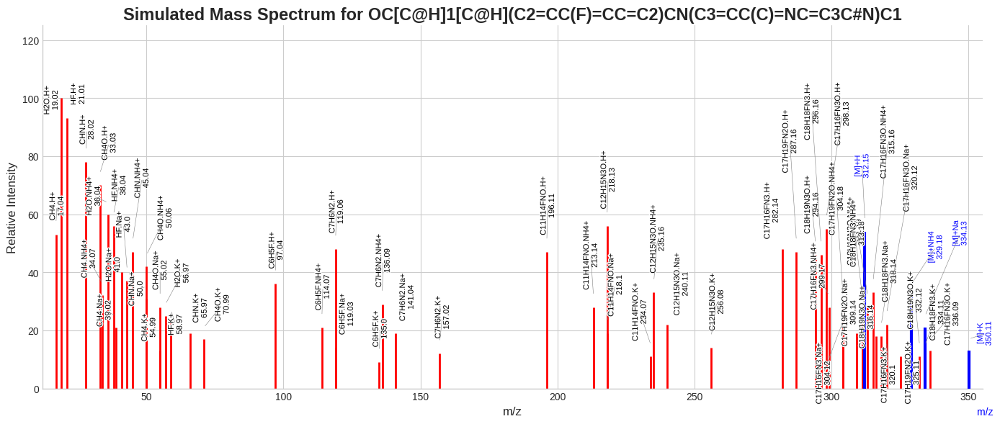

In [52]:

#@title Simulated MS Spectrum:

#
# first‑time users of Colab: uncomment the next line
# !pip -q install rdkit-pypi adjustText

import matplotlib.pyplot as plt
plt.style.use("seaborn-v0_8-whitegrid")          # crisp white‑grid theme
from adjustText import adjust_text
import matplotlib.patheffects as pe

from rdkit import Chem
from rdkit.Chem import rdMolDescriptors as Descriptors
from collections import Counter, defaultdict

# ───────────────────────────────────────────────────────────────
# 1.  Positive‑mode adduct masses (monoisotopic)
# ───────────────────────────────────────────────────────────────
ADDUCT_MASSES = {
    "H+":               1.007276,
    "NH4+":            18.033823,
    "Na+":             22.989218,
    "CH3OH+H+":        33.033489,
    "K+":              38.963158,
    "CH3CN+H+":        42.033825,      # CH3CN (41.02655) + H+
    "iPr+H+":          61.065339,      # isopropanol + H+
    "DMSO+H+":         79.021221,
}

# relative “probability” for each adduct (fiddle as you like)
ADDUCT_WEIGHTS = {
    "H+":        1.00,
    "NH4+":      0.60,
    "Na+":       0.40,
    "CH3OH+H+":  0.30,
    "K+":        0.25,
    "CH3CN+H+":  0.20,
    "iPr+H+":    0.15,
    "DMSO+H+":   0.10,
}

# ───────────────────────────────────────────────────────────────
# 2.  Simple weighting model (small + hetero‑rich fragments pop)
# ───────────────────────────────────────────────────────────────
ALPHA = 0.6     # higher → penalise heavy fragments more strongly

def frag_weight(frag, adduct):
    mass   = Descriptors.CalcExactMolWt(frag)
    hetero = sum(1 for a in frag.GetAtoms() if a.GetAtomicNum() not in (1, 6))
    base   = (hetero + 1) * mass ** (-ALPHA)
    return base * ADDUCT_WEIGHTS.get(adduct, 0.1)

# ───────────────────────────────────────────────────────────────
# 3.  Toy fragmentation (single‑bond cleavage, non‑ring bonds)
# ───────────────────────────────────────────────────────────────
def simulate_spectrum(smiles, adducts=None, skip_rings=True):
    if adducts is None:
        adducts = tuple(ADDUCT_MASSES)

    mol = Chem.MolFromSmiles(smiles)
    if mol is None:
        raise ValueError("Invalid SMILES")

    w_counter, label_map = Counter(), defaultdict(list)

    # 3‑A  molecular ion peaks
    parent_mass = Descriptors.CalcExactMolWt(mol)
    for ad in adducts:
        mz = round(parent_mass + ADDUCT_MASSES[ad], 4)
        w  = frag_weight(mol, ad)
        w_counter[mz] += w
        label_map[mz].append(f"[M]+{ad.replace('+','')}")

    # 3‑B  single‑bond cleavages
    for bond in mol.GetBonds():
        if skip_rings and bond.IsInRing():
            continue
        if bond.GetBondType() != Chem.BondType.SINGLE:
            continue
        split = Chem.FragmentOnBonds(mol, [bond.GetIdx()], addDummies=False)
        for frag in Chem.GetMolFrags(split, asMols=True, sanitizeFrags=True):
            mass    = Descriptors.CalcExactMolWt(frag)
            formula = Chem.rdMolDescriptors.CalcMolFormula(frag)
            for ad in adducts:
                mz = round(mass + ADDUCT_MASSES[ad], 4)
                w  = frag_weight(frag, ad)
                w_counter[mz] += w
                label_map[mz].append(f"{formula}.{ad}")

    # 3‑C  convert to relative intensity (base = 100)
    base = max(w_counter.values())
    peaks  = {m: int(w / base * 100) for m, w in w_counter.items()}
    labels = {m: ", ".join(sorted(set(l))) for m, l in label_map.items()}
    return peaks, labels

# ───────────────────────────────────────────────────────────────
# 4.  Plotting helper  (blue = all [M]+…  sticks)
# ───────────────────────────────────────────────────────────────
def plot_spectrum(peaks,
                  labels,
                  title="",
                  other_colour="red",
                  annotate_min=5,
                  font_size=8):
    mz_all = sorted(peaks)
    ints   = [peaks[m] for m in mz_all]

    # split molecular‑ion vs others
    mol_mz = [m for m in mz_all if labels[m].startswith("[M]+")]
    reg_mz = [m for m in mz_all if m not in mol_mz]

    fig, ax = plt.subplots(figsize=(14, 6))
    if reg_mz:
        ax.vlines(reg_mz, 0, [peaks[m] for m in reg_mz],
                  colors=other_colour, lw=2, zorder=2)
    if mol_mz:
        ax.vlines(mol_mz, 0, [peaks[m] for m in mol_mz],
                  colors="blue", lw=3, zorder=3)

    # annotate
    y_off = max(ints) * 0.04
    texts = []
    for m in mz_all:
        if peaks[m] < annotate_min:
            continue
        tcol = "blue" if m in mol_mz else "black"
        txt = f"{labels[m]}\n{round(m,2)}"
        texts.append(ax.text(
            m, peaks[m] + y_off, txt,
            ha="center", va="bottom", rotation=90, color=tcol,
            fontsize=font_size,
            path_effects=[pe.withStroke(linewidth=2, foreground="white")]))

    adjust_text(texts,
                only_move={"points":"y", "texts":"xy"},
                autoalign="y",
                precision=0.5,
                expand_points=(1.2, 1.2),
                arrowprops=dict(arrowstyle="-", color="gray", lw=0.4))

    # cosmetics
    ax.set_xlim(min(mz_all) - 5, max(mz_all) + 5)
    ax.set_ylim(0, max(ints) * 1.25)
    ax.set_xlabel("m/z", fontsize=12)
    ax.set_ylabel("Relative Intensity", fontsize=12)
    ax.set_title(title, weight="bold", fontsize=17)
    ax.spines[["top", "right"]].set_visible(False)

    # “m/z →” arrow
    ax.annotate("", xy=(max(mz_all) + 2, -y_off*2),
                xytext=(min(mz_all) - 2, -y_off*2),
                arrowprops=dict(arrowstyle="->", color="blue"))
    ax.text(max(mz_all) + 3, -y_off*2, "m/z",
            color="blue", va="center", fontsize=10)

    plt.tight_layout()
    return fig, ax

# ───────────────────────────────────────────────────────────────
# 5.  Quick interactive run
# ───────────────────────────────────────────────────────────────
if __name__ == "__main__":
    smi = input("Enter a SMILES (e.g. CCO): ").strip()
    peaks, lbls = simulate_spectrum(smi, adducts=("H+","NH4+","Na+","K+"))
    plot_spectrum(peaks, lbls,
                  title=f"Simulated Mass Spectrum for {smi}",
                  other_colour="red",
                  annotate_min=5,
                  font_size=8)
    plt.show()